# Session 7: Machine Learning for Data Assimilation (Continued) & Visualize Your Results

In this session, we explore the integration of machine learning techniques within data assimilation frameworks.

We will discuss the following two key topics:

1. Physical Parameter Estimation (Continued)
- Monte Carlo Expectation Maximization
- Auto-Differentiable Kalman Filter
2. Likelihood-Free Ensemble Transport Filtering

We will discuss how to effectively visualize of experimental results to enhance your presentation.

## 1 Physical Parameter Estimation with **model noise**

Refer to **Sections~8.2 \& 8.3**

### 1.1 Problem Setting: Estimation of $\vartheta$ and $\Sigma$

The inverse problem of estimating the model parameters $\vartheta = \{\sigma, \rho\}$ and the model error covariance $\Sigma$ in the Lorenz-63 system given a partial observation trajectory is considered. Let $\theta = \{\vartheta, \Sigma\}$ denote the complete set of unknown parameters. The system dynamics are defined by a discrete-time map $\Psi_\vartheta$, integrated using a Runge-Kutta 4th order scheme with a time step $dt=0.03$. The true states evolve according to the stochastic difference equation
$$v_{j+1}^\dagger = \Psi_\vartheta(v_j^\dagger) + \xi_j^\dagger, \quad \xi_j^\dagger \sim \mathcal{N}(0, \Sigma),$$
where the model error covariance $\Sigma$ is assumed to be a **diagonal matrix** with the ground truth value $\Sigma^* = \sigma_v^2 I$.

In previous settings (Session 6), the model was assumed to be a deterministic ODE. Under such deterministic assumptions, the likelihood of the observations given the parameters can be computed directly by integrating the system and evaluating the mismatch at observation times. However, the presence of model error $\xi_j^\dagger$ fundamentally changes the assimilation problem. When the dynamics are stochastic, the exact likelihood $\mathbb{P}(Y^\dagger | \theta)$ becomes intractable to compute directly because it requires marginalizing over the distribution of the latent state trajectory $V^\dagger$. This notebook specifically addresses this more complex scenario by incorporating the dynamic noise $\Sigma$ into the estimation framework.

Observations are restricted to the first state component at discrete intervals $\Delta t_{\text{obs}}$. The dataset $Y^\dagger$ consists of 50 noisy measurements generated from the ground truth trajectory with $\vartheta^* = \{10, 28\}$, defined as
$$Y^\dagger = \{y^\dagger_1, \ldots, y^\dagger_{J}\}, \quad y^\dagger_{j+1} = H v_{j+1}^\dagger + \eta_{j+1}^\dagger, \quad \eta_{j+1}^\dagger \sim \mathcal{N}(0, \Gamma),$$
with the observation noise covariance $\Gamma = \sigma_y^2 I$.

### 1.2 Monte Carlo Expectation Maximization (MCEM)

The problem of estimating the unknown parameters $\theta = \{\vartheta, \Sigma\}$ from the partial and noisy observation trajectory $Y^\dagger$ is treated as a missing data problem by considering the unobserved state trajectory $V^\dagger$ as a latent variable. The marginal likelihood is mathematically expressed by marginalizing the joint extended likelihood over the latent states. This is defined by the integral
$$\mathbb{P}(Y^\dagger|\theta) = \int \mathbb{P}(Y^\dagger|V^\dagger, \theta) \mathbb{P}(V^\dagger|\theta) dV^\dagger.$$

Taking the logarithm of the joint distribution $\mathbb{P}(Y^\dagger, V^\dagger|\theta)$ requires expanding the terms based on the given dynamics and observation models. The observation conditional probability is independent for each time step given the state, yielding
$$\log \mathbb{P}(Y^\dagger|V^\dagger, \theta) = -\frac{1}{2}\sum_{j=0}^{J-1}|y_{j+1}^\dagger - H v_{j+1}^\dagger|_\Gamma^2 + c_1.$$

The state transition probability is Markovian, yielding
$$\log \mathbb{P}(V^\dagger|\theta) = -\frac{1}{2}|v_0^\dagger - m_0|_{C_0}^2 - \frac{1}{2}\log\det(\Sigma) - \frac{1}{2}\sum_{j=0}^{J-1}|v_{j+1}^\dagger - \Psi_\vartheta(v_j^\dagger)|_\Sigma^2 + c_2.$$

Combining these expressions forms the extended log-likelihood $\log \mathbb{P}(Y^\dagger, V^\dagger|\theta)$. The E-step maximizes the expected complete-data log-likelihood evaluated over the posterior $q^l(V^\dagger) = \mathbb{P}(V^\dagger|Y^\dagger, \theta^l)$. Because the nonlinear dynamics render the exact analytical expectation intractable, a set of $N$ Monte Carlo samples $\{(V^\dagger)^{(n)}\}_{n=1}^N$ is drawn from $q^l(V^\dagger)$. The empirical loss function isolates the terms dependent on $\theta = \{\vartheta, \Sigma\}$, taking the form
$$L(\theta; q^l) \approx c - \frac{1}{2}\log\det(\Sigma) - \frac{1}{2N}\sum_{n=1}^N\sum_{j=0}^{J-1} (v_{j+1}^\dagger - \Psi_\vartheta(v_j^\dagger))^\top \Sigma^{-1} (v_{j+1}^\dagger - \Psi_\vartheta(v_j^\dagger)).$$

Differentiating $L(\theta; q^l)$ with respect to the precision matrix $\Sigma^{-1}$ and equating to zero yields the exact maximum for the covariance matrix update,
$$\Sigma^{l+1} = \frac{1}{N}\sum_{n=1}^N\sum_{j=0}^{J-1} \left( (v_{j+1}^\dagger)^{(n)} - \Psi_\vartheta((v_j^\dagger)^{(n)}) \right) \otimes \left( (v_{j+1}^\dagger)^{(n)} - \Psi_\vartheta((v_j^\dagger)^{(n)}) \right).$$

The physical parameters $\vartheta$ do not possess a closed-form solution and are updated by applying gradient ascent on the loss function using the updated covariance $\Sigma^{l+1}$. The ascent step is computed as
$$\vartheta^{l+1} = \vartheta^l + \alpha D_\vartheta J(\vartheta^l, \{(V^\dagger)^{(n)}\}_{n=1}^N),$$
where $\alpha$ is the specified step size.

---

### 1.3 Auto-Differentiable Kalman Filters (ADKF)

Auto-differentiable Kalman filters maximize the exact marginal likelihood $\log \mathbb{P}(Y^\dagger|\theta)$ directly by employing a Gaussian ansatz for the predictive distributions. Using the definition of conditional probability, the joint probability of the observations is factored sequentially. Taking the logarithm gives the sum
$$\log \mathbb{P}(Y^\dagger|\theta) = \sum_{j=0}^{J-1} \log \mathbb{P}(y_{j+1}^\dagger|Y_j^\dagger, \theta).$$

The predictive distribution of the state at time $j+1$ given observations up to time $j$ is approximated as a Gaussian distribution $\mathbb{P}(v_{j+1}^\dagger|Y_j^\dagger, \theta) \approx \mathcal{N}(\hat{m}_{j+1}(\theta), \hat{C}_{j+1}(\theta))$. Given the linear observation model $y_{j+1}^\dagger = H v_{j+1}^\dagger + \eta_{j+1}^\dagger$ where $\eta_{j+1}^\dagger \sim \mathcal{N}(0, \Gamma)$, the conditional distribution of $y_{j+1}^\dagger$ remains Gaussian. The expectation of the observation is computed by taking the expected value of the observation model,
$$\mathbb{E}[y_{j+1}^\dagger|Y_j^\dagger, \theta] = \mathbb{E}[H v_{j+1}^\dagger + \eta_{j+1}^\dagger|Y_j^\dagger, \theta] = H \hat{m}_{j+1}(\theta).$$

The covariance of the observation, denoted as the innovation covariance $S_{j+1}(\theta)$, is computed by exploiting the independence of the state prediction and the observation noise,
$$\text{Cov}[y_{j+1}^\dagger|Y_j^\dagger, \theta] = \text{Cov}[H v_{j+1}^\dagger + \eta_{j+1}^\dagger|Y_j^\dagger, \theta] = H \hat{C}_{j+1}(\theta) H^\top + \Gamma.$$

Substituting the Gaussian density parameters into the log-likelihood expansion results in the objective function
$$J(\theta) = -\frac{1}{2}\sum_{j=0}^{J-1}|y_{j+1}^\dagger - H \hat{m}_{j+1}(\theta)|_{S_{j+1}(\theta)}^2 - \frac{1}{2}\sum_{j=0}^{J-1}\log\det(S_{j+1}(\theta)).$$

To maximize $J(\theta)$, the predictive means $\hat{m}_{j+1}(\theta)$ and covariances $\hat{C}_{j+1}(\theta)$ are computed dynamically at each step using an extended or ensemble Kalman filtering algorithm. The gradient $D J(\theta^l)$ is subsequently derived by applying automatic differentiation through the unrolled filter operations. The parameter estimate is updated via gradient ascent
$$\theta^{l+1} = \theta^l + \alpha^l D J(\theta^l).$$

---
### 1.4 Comparison Metrics

The accuracy of the estimated parameters $\hat{\theta} = \{\hat{\vartheta}, \hat{\Sigma}\}$ is evaluated by computing their deviation from the ground truth. For the physical parameters $\vartheta = \{\sigma, \rho\}$, the absolute error is computed as
$$E_\sigma = |\hat{\sigma} - \sigma^*|, \quad E_\rho = |\hat{\rho} - \rho^*|.$$
The deviation of the estimated model error covariance matrix $\hat{\Sigma}$ from the true isotropic covariance $\Sigma^* = \sigma_v^2 I$ is measured using the Frobenius norm, given by
$$E_\Sigma = \|\hat{\Sigma} - \sigma_v^2 I\|_F.$$

To assess the dynamic fidelity of the learned model, the Root Mean Square Error (RMSE) is computed between the true latent state trajectory $V^\dagger$ and the predicted trajectory $\hat{V}$ generated by integrating the system with the estimated parameters $\hat{\theta}$. The trajectory RMSE over $J$ integration steps is defined as
$$\text{RMSE} = \sqrt{\frac{1}{J+1} \sum_{j=0}^J \|\hat{v}_j - v_j^\dagger\|_2^2}.$$

ADKF Optimization:   0%|          | 0/500 [00:00<?, ?it/s]

MCEM Iterations:   0%|          | 0/10 [00:00<?, ?it/s]

=== Parameter Estimates & Errors ===
True Theta: Sigma=10.0, Rho=28.0, True Sigma_v: 0.02
ADKF Theta: Sigma=10.0419, Rho=27.9517 | Est Sigma_v (diag): [0.02210727 0.02210727 0.02210727]
MCEM Theta: Sigma=9.6544, Rho=28.0379 | Est Sigma_v (diag): [0.5655425  1.4798036  0.89726007]

ADKF Errors -> E_sigma: 0.0419, E_rho: 0.0483, E_Sigma: 0.000154, RMSE: 8.9573
MCEM Errors -> E_sigma: 0.3456, E_rho: 0.0379, E_Sigma: 2.354378, RMSE: 8.2193


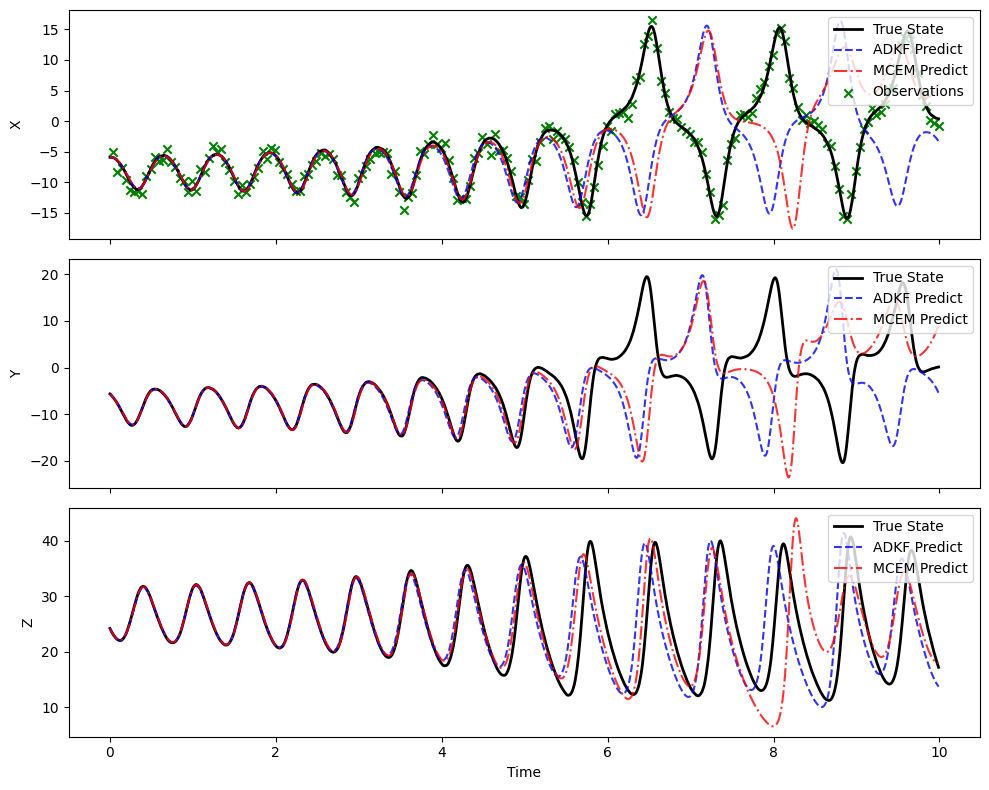

In [ ]:
import jax
import jax.numpy as jnp
from jax import random, value_and_grad, jacfwd, vmap
import optax
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# ==========================================
# 1. General Settings
# ==========================================
# @markdown ### Ground Truth & Environment
true_sigma = 10.0  # @param {type:"number"}
true_rho = 28.0  # @param {type:"number"}
sigma_v = 0.02  # @param {type:"number"}
obs_noise_gamma = 1.0  # @param {type:"number"}
n_obs = 200  # @param {type:"integer"}
dt = 0.01  # @param {type:"number"}
obs_interval_steps = 5  # @param {type:"integer"}

true_beta = 2.66667

# ==========================================
# 2. Initialization Parameters
# ==========================================
# @markdown ### Initial Guesses for Optimization
init_sigma = 12.0  # @param {type:"number"}
init_rho = 25.0  # @param {type:"number"}
init_sigma_v = 0.1  # @param {type:"number"}

# ==========================================
# 3. Method Specific Parameters
# ==========================================
# @markdown ### ADKF & MCEM Settings
adkf_iters = 500  # @param {type:"integer"}
mcem_iters = 10  # @param {type:"integer"}
mc_samples = 300  # @param {type:"integer"}

n_steps = n_obs * obs_interval_steps
key = random.PRNGKey(42)


def lorenz_63(state, theta):
    """
    Computes continuous-time derivative of Lorenz-63.
    Input: state (array), theta (array).
    Output: time derivatives (array).
    """
    x, y, z = state
    sigma, rho, beta = theta
    dx = sigma * (y - x)
    dy = x * (rho - z) - y
    dz = x * y - beta * z
    return jnp.array([dx, dy, dz])


def rk4_step(state, theta, dt):
    """
    Performs one step of 4th-order Runge-Kutta integration with clipping.
    Input: state (array), theta (array), dt (scalar).
    Output: next state (array).
    """
    k1 = lorenz_63(state, theta)
    k2 = lorenz_63(state + 0.5 * dt * k1, theta)
    k3 = lorenz_63(state + 0.5 * dt * k2, theta)
    k4 = lorenz_63(state + dt * k3, theta)
    next_state = state + (dt / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)
    return jnp.clip(next_state, -500.0, 500.0)


theta_true = jnp.array([true_sigma, true_rho, true_beta])
H = jnp.array([[1.0, 0.0, 0.0]])
Gamma = jnp.array([[obs_noise_gamma]])
Sigma_true = (sigma_v ** 2) * jnp.eye(3)


def generate_data(key, init_state, n_steps):
    """
    Generates ground truth trajectory and noisy observations.
    Input: key (PRNGKey), init_state (array), n_steps (int).
    Output: tuple of true states (array) and observations (array).
    """
    keys = random.split(key, n_steps)

    def step_fn(state, k):
        k1, k2 = random.split(k)
        model_noise = random.multivariate_normal(k1, jnp.zeros(3), Sigma_true)
        next_state = rk4_step(state, theta_true, dt) + model_noise
        obs = H @ next_state + random.multivariate_normal(k2, jnp.zeros(1), Gamma)
        return next_state, (next_state, obs)

    _, (states, obs) = jax.lax.scan(step_fn, init_state, keys)
    return states, obs


init_state = jnp.array([-5.91, -5.52, 24.57])
key, subkey = random.split(key)
true_states, all_obs = generate_data(subkey, init_state, n_steps)

obs_mask = jnp.arange(n_steps) % obs_interval_steps == (obs_interval_steps - 1)
observations = jnp.where(obs_mask[:, None], all_obs, 0.0)

rk4_jac = jacfwd(rk4_step, argnums=0)


def project_psd(C, eps=1e-6):
    """
    Projects a symmetric matrix to PSD cone with eigenvalue floor.
    Input: C (array), eps (float).
    Output: PSD matrix (array).
    """
    C_sym = 0.5 * (C + C.T)
    evals, evecs = jnp.linalg.eigh(C_sym)
    evals_clipped = jnp.maximum(evals, eps)
    return evecs @ jnp.diag(evals_clipped) @ evecs.T


def adkf_nll(params, init_state, init_cov, obs, obs_mask):
    """
    Computes negative log-likelihood of observations using EKF.
    Input: params (dict), init_state (array), init_cov (array), obs (array), obs_mask (array).
    Output: scalar negative log-likelihood.
    """
    theta = jnp.array([params["sigma"], params["rho"], true_beta])
    Sigma = jnp.exp(params["log_sigma_v2"]) * jnp.eye(3)

    def filter_step(carry, inputs):
        m, C = carry
        y_obs, is_obs = inputs

        m_pred = rk4_step(m, theta, dt)
        F = rk4_jac(m, theta, dt)
        C_pred = F @ C @ F.T + Sigma
        C_pred = project_psd(C_pred, eps=1e-8)

        def update_fn():
            S = H @ C_pred @ H.T + Gamma + 1e-8 * jnp.eye(1)
            K = C_pred @ H.T @ jnp.linalg.inv(S)
            m_up = m_pred + K @ (y_obs - H @ m_pred)

            # Joseph stabilized covariance update
            I = jnp.eye(3)
            C_up = (I - K @ H) @ C_pred @ (I - K @ H).T + K @ Gamma @ K.T
            C_up = project_psd(C_up, eps=1e-8)

            inn = y_obs - H @ m_pred
            nll_step = 0.5 * (
                inn.T @ jnp.linalg.inv(S) @ inn
                + jnp.log(jnp.linalg.det(S))
                + jnp.log(2 * jnp.pi)
            )
            return m_up, C_up, jnp.squeeze(nll_step)

        def no_update_fn():
            return m_pred, C_pred, 0.0

        m_next, C_next, nll_val = jax.lax.cond(is_obs, update_fn, no_update_fn)
        return (m_next, C_next), (m_next, nll_val)

    _, (m_traj, nll_traj) = jax.lax.scan(filter_step, (init_state, init_cov), (obs, obs_mask))
    return jnp.sum(nll_traj)


init_params = {
    "sigma": init_sigma,
    "rho": init_rho,
    "log_sigma_v2": jnp.log(init_sigma_v**2),
}
optimizer_adkf = optax.adam(learning_rate=0.05)
opt_state_adkf = optimizer_adkf.init(init_params)


@jax.jit
def adkf_update(params, opt_state):
    """
    Performs one ADKF optimization step.
    Input: params (dict), opt_state (optax state).
    Output: tuple of updated params, opt_state, and loss.
    """
    loss, grads = value_and_grad(adkf_nll)(params, init_state, jnp.eye(3), observations, obs_mask)
    updates, opt_state = optimizer_adkf.update(grads, opt_state)
    new_params = optax.apply_updates(params, updates)
    return new_params, opt_state, loss


params_adkf = init_params
for i in tqdm(range(adkf_iters), desc="ADKF Optimization"):
    params_adkf, opt_state_adkf, loss = adkf_update(params_adkf, opt_state_adkf)
    if jnp.isnan(loss) or jnp.isnan(params_adkf["sigma"]):
        print(f"Warning: ADKF optimization encountered NaN at iteration {i}.")
        break

theta_adkf = jnp.array([params_adkf["sigma"], params_adkf["rho"], true_beta])
Sigma_adkf = jnp.exp(params_adkf["log_sigma_v2"]) * jnp.eye(3)


def run_ekf_smoother(theta, Sigma, init_state, init_cov, obs, obs_mask):
    """
    Runs Forward EKF and RTS Smoother.
    Input: theta (array), Sigma (array), init_state (array), init_cov (array), obs (array), obs_mask (array).
    Output: tuple of smoothed means (array) and covariances (array).
    """
    def filter_step(carry, inputs):
        m, C = carry
        y_obs, is_obs = inputs

        m_pred = rk4_step(m, theta, dt)
        F = rk4_jac(m, theta, dt)
        C_pred = F @ C @ F.T + Sigma
        C_pred = project_psd(C_pred, eps=1e-6)

        def update():
            S = H @ C_pred @ H.T + Gamma + 1e-6 * jnp.eye(1)
            K = C_pred @ H.T @ jnp.linalg.inv(S)
            m_up = m_pred + K @ (y_obs - H @ m_pred)

            # Joseph stabilized covariance update
            I = jnp.eye(3)
            C_up = (I - K @ H) @ C_pred @ (I - K @ H).T + K @ Gamma @ K.T
            C_up = project_psd(C_up, eps=1e-6)
            return m_up, C_up

        m_next, C_next = jax.lax.cond(is_obs, update, lambda: (m_pred, C_pred))
        return (m_next, C_next), (m_pred, C_pred, m_next, C_next, F)

    _, (m_p, C_p, m_f, C_f, F_traj) = jax.lax.scan(
        filter_step, (init_state, init_cov), (obs, obs_mask)
    )

    def smooth_step(carry, inputs):
        m_s_next, C_s_next = carry
        m_f_curr, C_f_curr, m_p_next, C_p_next, F_curr = inputs

        C_f_curr = project_psd(C_f_curr, eps=1e-6)
        C_p_next = project_psd(C_p_next, eps=1e-4)
        C_s_next = project_psd(C_s_next, eps=1e-6)

        # More stable gain computation than pinv on nearly singular matrices
        G = C_f_curr @ F_curr.T @ jnp.linalg.inv(C_p_next)

        m_s = m_f_curr + G @ (m_s_next - m_p_next)
        C_s = C_f_curr + G @ (C_s_next - C_p_next) @ G.T
        C_s = project_psd(C_s, eps=1e-6)
        return (m_s, C_s), (m_s, C_s)

    smooth_inputs = (m_f[:-1], C_f[:-1], m_p[1:], C_p[1:], F_traj[:-1])
    _, (m_s_rev, C_s_rev) = jax.lax.scan(
        smooth_step, (m_f[-1], C_f[-1]), smooth_inputs, reverse=True
    )

    m_s = jnp.concatenate([m_s_rev, m_f[-1:]], axis=0)
    C_s = jnp.concatenate([C_s_rev, C_f[-1:]], axis=0)
    C_s = vmap(project_psd, in_axes=(0, None))(C_s, 1e-6)
    return m_s, C_s


# MCEM initialization (use ADKF result as warm start)
theta_mcem = theta_adkf
Sigma_mcem = project_psd(Sigma_adkf, eps=1e-6)

# Reparameterized MCEM parameters for positivity and stability
raw_theta_mcem = {
    "raw_sigma": jnp.log(jnp.expm1(jnp.maximum(theta_mcem[0], 1e-3))),
    "raw_rho": jnp.log(jnp.expm1(jnp.maximum(theta_mcem[1], 1e-3))),
}


def unpack_theta(raw_params):
    """
    Maps unconstrained optimization variables to positive Lorenz parameters.
    Input: raw_params (dict).
    Output: theta (array).
    """
    sigma = jax.nn.softplus(raw_params["raw_sigma"]) + 1e-4
    rho = jax.nn.softplus(raw_params["raw_rho"]) + 1e-4

    # Hard clip to a numerically safe range for Lorenz-63 estimation
    sigma = jnp.clip(sigma, 1.0, 40.0)
    rho = jnp.clip(rho, 1.0, 60.0)
    return jnp.array([sigma, rho, true_beta])


def m_step_objective(raw_params, samples, Sigma_inv):
    """
    Computes MCEM M-step objective for theta using sampled latent paths.
    Input: raw_params (dict), samples (array), Sigma_inv (array).
    Output: scalar loss.
    """
    theta = unpack_theta(raw_params)

    def one_sample_loss(s):
        pred = vmap(rk4_step, in_axes=(0, None, None))(s[:-1], theta, dt)
        diff = s[1:] - pred

        def one_t(x):
            return 0.5 * (x.T @ Sigma_inv @ x)

        return jnp.sum(vmap(one_t)(diff))

    losses = vmap(one_sample_loss)(samples)
    return jnp.mean(losses)


optimizer_mcem = optax.chain(
    optax.clip_by_global_norm(0.5),
    optax.adam(learning_rate=0.005),
)
opt_state_mcem = optimizer_mcem.init(raw_theta_mcem)


@jax.jit
def m_step_theta(raw_params, opt_state, samples, Sigma_inv):
    """
    Performs one M-step gradient update on reparameterized theta.
    Input: raw_params (dict), opt_state (optax state), samples (array), Sigma_inv (array).
    Output: updated raw_params and opt_state.
    """
    loss, grads = value_and_grad(m_step_objective)(raw_params, samples, Sigma_inv)
    updates, opt_state = optimizer_mcem.update(grads, opt_state)
    raw_params = optax.apply_updates(raw_params, updates)
    return raw_params, opt_state, loss


def finite_check(name, x):
    """
    Returns True if all values are finite, otherwise prints a warning.
    Input: name (str), x (array/pytree).
    Output: bool.
    """
    leaves = jax.tree_util.tree_leaves(x)
    ok = True
    for leaf in leaves:
        if not jnp.all(jnp.isfinite(leaf)):
            ok = False
            break
    if not ok:
        print(f"Warning: {name} contains non-finite values.")
    return ok

def sample_smoothing_trajectories_ffbs_approx(key, m_smooth, C_smooth, theta, Sigma, n_samples):
    """
    Samples full trajectories approximately from the joint smoothing distribution
    using backward simulation with local linearization.
    Input: key (PRNGKey), m_smooth (T,3), C_smooth (T,3,3), theta (3,), Sigma (3,3), n_samples (int).
    Output: samples (n_samples, T, 3).
    """
    T = m_smooth.shape[0]

    # Precompute local linearization and backward conditional gains
    F_list = vmap(lambda m: rk4_jac(m, theta, dt))(m_smooth[:-1])  # (T-1, 3, 3)

    def one_step_gain(m_t, C_t, F_t, C_tp1, Sigma):
        C_t_psd = project_psd(C_t, eps=1e-6)
        C_tp1_psd = project_psd(C_tp1, eps=1e-6)
        S_bridge = F_t @ C_t_psd @ F_t.T + Sigma
        S_bridge = project_psd(S_bridge, eps=1e-5)
        J = C_t_psd @ F_t.T @ jnp.linalg.inv(S_bridge)

        # Approximate conditional covariance of x_t | x_{t+1}, y
        C_cond = C_t_psd - J @ C_tp1_psd @ J.T
        C_cond = project_psd(C_cond, eps=1e-6)
        return J, C_cond

    J_list, Ccond_list = vmap(one_step_gain, in_axes=(0, 0, 0, 0, None))(
        m_smooth[:-1], C_smooth[:-1], F_list, C_smooth[1:], Sigma
    )  # J_list: (T-1,3,3), Ccond_list: (T-1,3,3)

    def sample_one_traj(k):
        """
        Samples one trajectory x_{0:T-1} by backward simulation.
        """
        keys = random.split(k, T)

        # Sample terminal state x_{T-1} ~ N(m_{T-1|T}, C_{T-1|T})
        C_T = project_psd(C_smooth[-1], eps=1e-6)
        x_T = random.multivariate_normal(keys[-1], m_smooth[-1], C_T)

        xs_rev = [x_T]
        x_next = x_T

        # Backward sampling: x_t | x_{t+1}, y
        for t in range(T - 2, -1, -1):
            m_t = m_smooth[t]
            m_tp1 = m_smooth[t + 1]
            J_t = J_list[t]
            Ccond_t = Ccond_list[t]

            # Approximate conditional mean from smoothing marginals
            mean_cond = m_t + J_t @ (x_next - m_tp1)
            x_t = random.multivariate_normal(keys[t], mean_cond, Ccond_t)

            xs_rev.append(x_t)
            x_next = x_t

        # Reverse to chronological order
        xs = jnp.stack(xs_rev[::-1], axis=0)  # (T,3)
        return xs

    traj_keys = random.split(key, n_samples)
    samples = vmap(sample_one_traj)(traj_keys)
    return samples

for em_iter in tqdm(range(mcem_iters), desc="MCEM Iterations"):
    theta_mcem = unpack_theta(raw_theta_mcem)

    m_smooth, C_smooth = run_ekf_smoother(theta_mcem, Sigma_mcem, init_state, jnp.eye(3), observations, obs_mask)

    if not finite_check(f"MCEM E-step m_smooth (iter {em_iter})", m_smooth):
        break
    if not finite_check(f"MCEM E-step C_smooth (iter {em_iter})", C_smooth):
        break

    key, subkey = random.split(key)

    samples = sample_smoothing_trajectories_ffbs_approx(
        subkey, m_smooth, C_smooth, theta_mcem, Sigma_mcem, mc_samples
    )

    if not finite_check(f"MCEM samples (iter {em_iter})", samples):
        break

    preds = vmap(
        lambda s: vmap(rk4_step, in_axes=(0, None, None))(s[:-1], theta_mcem, dt)
    )(samples)
    diffs = samples[:, 1:, :] - preds

    if not finite_check(f"MCEM diffs (iter {em_iter})", diffs):
        break

    Sigma_mcem_raw = jnp.mean(
        vmap(lambda d: vmap(lambda x: jnp.outer(x, x))(d))(diffs),
        axis=(0, 1),
    )

    if not finite_check(f"Sigma_mcem_raw (iter {em_iter})", Sigma_mcem_raw):
        break

    Sigma_mcem = jnp.diag(jnp.diag(Sigma_mcem_raw))
    Sigma_mcem = project_psd(Sigma_mcem, eps=1e-6)

    if not finite_check(f"Sigma_mcem (iter {em_iter})", Sigma_mcem):
        break

    Sigma_inv = jnp.linalg.inv(Sigma_mcem)

    for inner_idx in range(10):
        raw_theta_mcem, opt_state_mcem, m_loss = m_step_theta(raw_theta_mcem, opt_state_mcem, samples, Sigma_inv)
        if not finite_check(f"M-step raw_theta (iter {em_iter}, inner {inner_idx})", raw_theta_mcem):
            break
        if not finite_check(f"M-step loss (iter {em_iter}, inner {inner_idx})", m_loss):
            break

    theta_mcem = unpack_theta(raw_theta_mcem)

    if not finite_check(f"theta_mcem (iter {em_iter})", theta_mcem):
        break
    if not finite_check(f"Sigma_mcem final (iter {em_iter})", Sigma_mcem):
        break


def simulate_traj(theta, n_steps):
    """
    Simulates deterministic trajectory using RK4.
    Input: theta (array), n_steps (int).
    Output: trajectory (array).
    """
    def step(state, _):
        next_state = rk4_step(state, theta, dt)
        return next_state, next_state

    _, traj = jax.lax.scan(step, init_state, jnp.arange(n_steps))
    return traj


traj_adkf = simulate_traj(theta_adkf, n_steps)
traj_mcem = simulate_traj(theta_mcem, n_steps)

rmse_adkf = jnp.sqrt(jnp.mean((traj_adkf - true_states) ** 2))
rmse_mcem = jnp.sqrt(jnp.mean((traj_mcem - true_states) ** 2))

sigma_diag_adkf = jnp.sqrt(jnp.diag(Sigma_adkf))
sigma_diag_mcem = jnp.sqrt(jnp.diag(Sigma_mcem))

print("=== Parameter Estimates & Errors ===")
print(f"True Theta: Sigma={true_sigma}, Rho={true_rho}, True Sigma_v: {sigma_v}")
print(f"ADKF Theta: Sigma={theta_adkf[0]:.4f}, Rho={theta_adkf[1]:.4f} | Est Sigma_v (diag): {sigma_diag_adkf}")
print(f"MCEM Theta: Sigma={theta_mcem[0]:.4f}, Rho={theta_mcem[1]:.4f} | Est Sigma_v (diag): {sigma_diag_mcem}")

err_sigma_adkf, err_rho_adkf = jnp.abs(theta_adkf[0] - true_sigma), jnp.abs(theta_adkf[1] - true_rho)
err_sigma_mcem, err_rho_mcem = jnp.abs(theta_mcem[0] - true_sigma), jnp.abs(theta_mcem[1] - true_rho)

err_Sigma_adkf = jnp.linalg.norm(Sigma_adkf - Sigma_true, "fro")
err_Sigma_mcem = jnp.linalg.norm(Sigma_mcem - Sigma_true, "fro")

print(f"\nADKF Errors -> E_sigma: {err_sigma_adkf:.4f}, E_rho: {err_rho_adkf:.4f}, E_Sigma: {err_Sigma_adkf:.6f}, RMSE: {rmse_adkf:.4f}")
print(f"MCEM Errors -> E_sigma: {err_sigma_mcem:.4f}, E_rho: {err_rho_mcem:.4f}, E_Sigma: {err_Sigma_mcem:.6f}, RMSE: {rmse_mcem:.4f}")

time_axis = jnp.arange(n_steps) * dt
fig, axes = plt.subplots(3, 1, figsize=(10, 8), sharex=True)

for i, label in enumerate(["X", "Y", "Z"]):
    axes[i].plot(time_axis, true_states[:, i], "k-", label="True State", linewidth=2)
    axes[i].plot(time_axis, traj_adkf[:, i], "b--", label="ADKF Predict", alpha=0.8)
    axes[i].plot(time_axis, traj_mcem[:, i], "r-.", label="MCEM Predict", alpha=0.8)
    if i == 0:
        obs_times = time_axis[obs_mask]
        obs_vals = all_obs[obs_mask, 0]
        axes[i].scatter(obs_times, obs_vals, color="g", marker="x", label="Observations")
    axes[i].set_ylabel(label)
    axes[i].legend(loc="upper right")

axes[-1].set_xlabel("Time")
plt.tight_layout()
plt.show()

## 2 Likelihood-Free Ensemble Transport Filtering

### 2.1 Ensemble Transport Formulation

Assume the physical model parameters and the dynamic noise covariance $\Sigma$ are fixed. The forward dynamics are governed by a map $\Psi$, and the presence of model noise $\xi_j^\dagger \sim \mathcal{N}(0, \Sigma)$ renders the explicit evaluation of the likelihood function $l(y|v)$ intractable. Likelihood-Free Ensemble Transport Filtering circumvents the need for explicit likelihood evaluations by learning a deterministic transport map $T$ that directly transforms samples from the forecast distribution into samples from the analysis distribution.

Let $\theta \in \Theta$ denote the parameters of the transport map. At any time step $j$, an ensemble of $N$ particles is propagated through the stochastic dynamics and the observation model to yield samples from the joint distribution $\gamma_{j+1}(v, y) = \hat{\pi}_{j+1}(v)l(y|v)$. The generative process is given by
$$\hat{v}_{j+1}^{(n)} = \Psi(v_j^{(n)}) + \xi_j^{(n)}, \quad n=1,\ldots,N,$$
$$\hat{y}_{j+1}^{(n)} = H \hat{v}_{j+1}^{(n)} + \eta_{j+1}^{(n)}, \quad n=1,\ldots,N,$$
where $\xi_j^{(n)} \sim \mathcal{N}(0, \Sigma)$ and $\eta_{j+1}^{(n)} \sim \mathcal{N}(0, \Gamma)$.

The analysis step updates the ensemble by evaluating the parameterized transport map conditioned on the true observation $y_{j+1}^\dagger$:
$$v_{j+1}^{(n)} = T(\hat{v}_{j+1}^{(n)}, \hat{y}_{j+1}^{(n)}, y_{j+1}^\dagger; \theta), \quad n=1,\ldots,N.$$
The training process identifies the optimal parameters $\theta^*$ such that the map pushes forward the joint distribution of predictions and synthetic observations to the true filtering distribution $\pi_{j+1}$.

---

### 2.2 Learning the Map via Energy Distance Minimization

**Section 10.3.1**

Because the forecast and analysis distributions are represented empirically by ensembles, conventional divergences are ill-posed. The transport map parameters $\theta$ are optimized by minimizing the expected Energy Distance between the approximate and true filtering distributions.

The expected Energy Distance over the marginal distribution of observations $\kappa_{j+1}$ is expanded as
$$\mathbb{E}^{y_{j+1}^\dagger \sim \kappa_{j+1}} [\mathcal{D}_E^2(T(\cdot, y_{j+1}^\dagger; \theta)_\# \hat{\pi}_{j+1}, \pi_{j+1})] = c + L(\theta),$$
where $c$ is a constant independent of $\theta$, and $L(\theta)$ represents the optimizable loss function. Exploiting the factorization of the joint distribution $\gamma_{j+1}(v, y) = \pi_{j+1}(v)\kappa_{j+1}(y)$, the population loss function is written as
$$L(\theta) = 2\mathbb{E}^{(v, (v', y_{j+1}^\dagger)) \sim \hat{\pi}_{j+1} \otimes \gamma_{j+1}} |T(v, y_{j+1}^\dagger; \theta) - v'| - \mathbb{E}^{(v, v', y_{j+1}^\dagger) \sim \hat{\pi}_{j+1} \otimes \hat{\pi}_{j+1} \otimes \kappa_{j+1}} |T(v, y_{j+1}^\dagger; \theta) - T(v', y_{j+1}^\dagger; \theta)|.$$

Replacing the expectations with empirical averages over the generated ensemble pairs $\{(\hat{v}_{j+1}^{(n)}, \hat{y}_{j+1}^{(n)})\}_{n=1}^N$ yields the empirical loss function
$$L^N(\theta) = \frac{2}{N(N-1)}\sum_{m \neq n}^N |T(\hat{v}_{j+1}^{(n)}, \hat{y}_{j+1}^{(m)}; \theta) - \hat{v}_{j+1}^{(m)}| - \frac{1}{N(N-1)}\sum_{l \neq m, n}^N |T(\hat{v}_{j+1}^{(n)}, \hat{y}_{j+1}^{(l)}; \theta) - T(\hat{v}_{j+1}^{(m)}, \hat{y}_{j+1}^{(l)}; \theta)|,$$
where the first term forces the mapped forecast states to align with the state $\hat{v}_{j+1}^{(m)}$ corresponding to the observation $\hat{y}_{j+1}^{(m)}$, and the second term regularizes the map by maximizing the distance between pairwise map evaluations to prevent particle collapse.

---

### 2.3 Learning via Maximum Likelihood and Composed Maps

**Section 10.3.2**

An alternative formulation constructs the observation-dependent transport map $T$ by defining it as a composition of maps mediated by a standard reference distribution $\rho(v)$ (e.g., a standard isotropic Gaussian). Instead of learning $T$ directly, we assume that the transport map takes a specific composite form:
$$T(v, y, y_{j+1}^\dagger; \theta) = S(y_{j+1}^\dagger, \cdot; \theta)^{-1} \circ S(y, v; \theta),$$
where $S(y, v; \theta): \mathbb{R}^k \times \mathbb{R}^d \rightarrow \mathbb{R}^d$ is a parameterized transport map that is invertible with respect to the state $v$ for any given observation $y$.

The intermediate map $S$ is purposefully designed to push forward the conditional distribution $\mathbb{P}(v|y)$, associated with the joint distribution $\gamma_{j+1}(y, v)$, to the standard reference distribution $\rho(v)$. Consequently, its inverse $S(y, \cdot; \theta)^{-1}$ operates in reverse, mapping the reference distribution back to the conditional distribution $\mathbb{P}(v|y)$.

To learn the parameter $\theta$, we optimize the map $S$ by maximizing the exact log-likelihood of the joint state-observation ensemble. The optimal parameter $\theta^*$ is obtained by solving the maximum likelihood problem over the empirical samples:
$$\theta^* = \arg\max_\theta \frac{1}{N}\sum_{i=1}^N \log \mathbb{P}_{S}(\hat{v}_{j+1}^{(i)} | \hat{y}_{j+1}^{(i)}; \theta),$$
where the conditional density $\mathbb{P}_{S}$ induced by the normalizing flow $S$ is evaluated analytically using the change of variables formula:
$$\log \mathbb{P}_{S}(\hat{v}_{j+1}^{(i)} | \hat{y}_{j+1}^{(i)}; \theta) = \log \rho\left(S(\hat{y}_{j+1}^{(i)}, \hat{v}_{j+1}^{(i)}; \theta)\right) + \log \left| \det \nabla_v S(\hat{y}_{j+1}^{(i)}, \hat{v}_{j+1}^{(i)}; \theta) \right|.$$

Once the forward map $S$ is trained to optimality, the analysis step is explicitly executed by composing these operations on the forecast ensemble:
$$v_{j+1}^{(n)} = S(y_{j+1}^\dagger, \cdot; \theta^*)^{-1} \left( S(\hat{y}_{j+1}^{(n)}, \hat{v}_{j+1}^{(n)}; \theta^*) \right), \quad n=1,\ldots,N.$$

This composed transport possesses a clear probabilistic and physical intuition: it first maps the forecast state to the reference space conditioned on its own synthetic observation $\hat{y}_{j+1}^{(n)}$, and subsequently maps it back to the physical state space, but now conditioned on the true observation $y_{j+1}^\dagger$. Furthermore, if the architecture of $S$ is restricted strictly to the family of affine transformations, this composed transport map rigorously recovers the exact update equations of the traditional Ensemble Kalman Filter (EnKF).

Energy Distance MLP parameter count: 34179
Normalizing Flow (Real NVP) parameter count: 34694


Training Transport Maps:   0%|          | 0/200 [00:00<?, ?it/s]

Epoch 10: loss_ed=4.153492, loss_ml=6.953544
Epoch 20: loss_ed=4.902673, loss_ml=6.769063
Epoch 30: loss_ed=4.577878, loss_ml=6.539736
Epoch 40: loss_ed=3.925890, loss_ml=6.289239
Epoch 50: loss_ed=4.389490, loss_ml=6.439476
Epoch 60: loss_ed=4.282447, loss_ml=6.506443
Epoch 70: loss_ed=4.389574, loss_ml=6.587608
Epoch 80: loss_ed=3.885510, loss_ml=6.342410
Epoch 90: loss_ed=4.283383, loss_ml=6.464202
Epoch 100: loss_ed=4.315416, loss_ml=6.475256
Epoch 110: loss_ed=4.423423, loss_ml=6.516229
Epoch 120: loss_ed=4.206123, loss_ml=6.343217
Epoch 130: loss_ed=3.759618, loss_ml=6.292169
Epoch 140: loss_ed=3.877488, loss_ml=6.318056
Epoch 150: loss_ed=4.702085, loss_ml=6.719017
Epoch 160: loss_ed=4.575262, loss_ml=6.507505
Epoch 170: loss_ed=3.861890, loss_ml=6.413563
Epoch 180: loss_ed=4.164327, loss_ml=6.436587
Epoch 190: loss_ed=4.694115, loss_ml=6.597905
Epoch 200: loss_ed=4.747740, loss_ml=6.714802
Energy Distance Map RMSE: 0.7282
Normalizing Flow Map RMSE: 1.0813


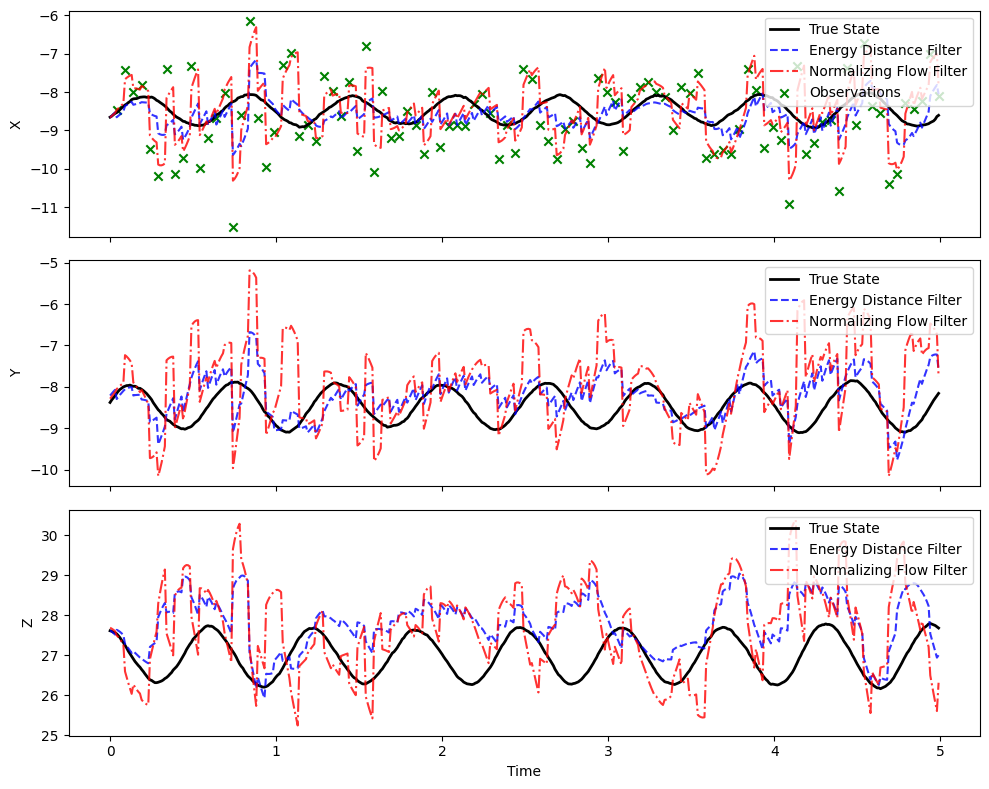

In [ ]:
import jax
import jax.numpy as jnp
from jax import random, value_and_grad, vmap
import optax
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# ==========================================
# 1. General Settings
# ==========================================
# @markdown ### Ground Truth & Environment
true_sigma = 10.0
true_rho = 28.0
true_beta = 2.66667
sigma_v = 0.01  # @param {type:"number"}
obs_noise_gamma = 1.0  # @param {type:"number"}
dt = 0.01  # @param {type:"number"}
obs_interval_steps = 5  # @param {type:"integer"}

# ==========================================
# 2. Data Generation Settings
# ==========================================
# @markdown ### Trajectory Configuration
n_train_trajs = 100  # @param {type:"integer"}
train_seq_len = 50  # @param {type:"integer"}
test_seq_len = 500  # @param {type:"integer"}
burn_in_steps = 100  # @param {type:"integer"}

# ==========================================
# 3. Method Specific Parameters
# ==========================================
# @markdown ### Filter & Training Settings
ensemble_size = 100  # @param {type:"integer"}
train_epochs = 200  # @param {type:"integer"}
batch_size = 64  # @param {type:"integer"}
lr_ed = 1e-3  # @param {type:"number"}
lr_ml = 1e-3  # @param {type:"number"}

# ==========================================
# 4. New Controllable NN Architecture Settings
# ==========================================
# @markdown ### NN Architecture (Controllable)
state_dim = 3
obs_dim = 1

# Energy Distance MLP
ed_hidden_dim = 128       # @param {type:"integer"}
ed_num_hidden_layers = 3 # @param {type:"integer"}  # Number of hidden layers before output

# Normalizing Flow (Real NVP) coupling subnetworks
flow_hidden_dim = 128         # @param {type:"integer"}
flow_num_hidden_layers = 2   # @param {type:"integer"}  # Hidden layers inside each coupling network
flow_latent_dim = 3

key = random.PRNGKey(42)

theta_true = jnp.array([true_sigma, true_rho, true_beta])
H = jnp.array([[1.0, 0.0, 0.0]])
Gamma = jnp.array([[obs_noise_gamma]])
Sigma_true = (sigma_v ** 2) * jnp.eye(state_dim)

if flow_latent_dim != state_dim:
    raise ValueError(
        "In this current Real NVP implementation, flow_latent_dim must equal state_dim "
        f"(got flow_latent_dim={flow_latent_dim}, state_dim={state_dim})."
    )

if ed_num_hidden_layers < 1:
    raise ValueError("ed_num_hidden_layers must be >= 1.")

if flow_num_hidden_layers < 1:
    raise ValueError("flow_num_hidden_layers must be >= 1.")


def count_params(tree):
    """
    Counts the total number of trainable scalar parameters in a PyTree.
    Input: tree (PyTree).
    Output: int.
    """
    leaves = jax.tree_util.tree_leaves(tree)
    total = 0
    for x in leaves:
        if hasattr(x, "size"):  # Count only array-like leaves
            total += x.size
    return int(total)


def init_dense_mlp_params(key, in_dim, hidden_dim, out_dim, num_hidden_layers):
    """
    Initializes a generic dense MLP parameter dictionary.
    Input: key (PRNGKey), in_dim (int), hidden_dim (int), out_dim (int), num_hidden_layers (int).
    Output: dict with lists of weights and biases.
    """
    n_layers_total = num_hidden_layers + 1  # Hidden layers + output layer
    keys = random.split(key, 2 * n_layers_total)

    weights = []
    biases = []

    # First hidden layer
    w = random.normal(keys[0], (in_dim, hidden_dim)) * jnp.sqrt(2.0 / in_dim)
    b = jnp.zeros(hidden_dim)
    weights.append(w)
    biases.append(b)

    # Additional hidden layers
    for i in range(1, num_hidden_layers):
        w = random.normal(keys[2 * i], (hidden_dim, hidden_dim)) * jnp.sqrt(2.0 / hidden_dim)
        b = jnp.zeros(hidden_dim)
        weights.append(w)
        biases.append(b)

    # Output layer
    w_out = random.normal(keys[2 * num_hidden_layers], (hidden_dim, out_dim)) * jnp.sqrt(2.0 / hidden_dim)
    b_out = jnp.zeros(out_dim)
    weights.append(w_out)
    biases.append(b_out)

    return {"weights": weights, "biases": biases}


def dense_mlp_forward(params, x, final_activation=False):
    """
    Forward pass for a generic dense MLP.
    Input: params (dict), x (array), final_activation (bool).
    Output: array.
    """
    n_layers = len(params["weights"])
    h = x
    for i in range(n_layers - 1):
        h = jax.nn.relu(h @ params["weights"][i] + params["biases"][i])
    h = h @ params["weights"][-1] + params["biases"][-1]
    if final_activation:
        h = jax.nn.relu(h)
    return h


def lorenz_63(state, theta):
    """
    Computes continuous-time derivative of Lorenz-63.
    Input: state (array), theta (array).
    Output: time derivatives (array).
    """
    x, y, z = state
    sigma, rho, beta = theta
    dx = sigma * (y - x)
    dy = x * (rho - z) - y
    dz = x * y - beta * z
    return jnp.array([dx, dy, dz])


def rk4_step(state, theta, dt):
    """
    Performs one step of 4th-order Runge-Kutta integration with clipping.
    Input: state (array), theta (array), dt (scalar).
    Output: next state (array).
    """
    k1 = lorenz_63(state, theta)
    k2 = lorenz_63(state + 0.5 * dt * k1, theta)
    k3 = lorenz_63(state + 0.5 * dt * k2, theta)
    k4 = lorenz_63(state + dt * k3, theta)
    next_state = state + (dt / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)
    return jnp.clip(next_state, -500.0, 500.0)


def generate_single_trajectory(key, seq_len, burn_in):
    """
    Generates a single trajectory with burn-in.
    Input: key (PRNGKey), seq_len (int), burn_in (int).
    Output: tuple of states (array) and observations (array).
    """
    k1, k2, k3 = random.split(key, 3)
    init_state = random.uniform(k1, (state_dim,), minval=-10.0, maxval=10.0)

    def burn_in_step(state, _):
        return rk4_step(state, theta_true, dt), None

    burned_state, _ = jax.lax.scan(burn_in_step, init_state, jnp.arange(burn_in))

    def step_fn(state, k):
        ka, kb = random.split(k)
        model_noise = random.multivariate_normal(ka, jnp.zeros(state_dim), Sigma_true)
        next_state = rk4_step(state, theta_true, dt) + model_noise
        obs = H @ next_state + random.multivariate_normal(kb, jnp.zeros(obs_dim), Gamma)
        return next_state, (next_state, obs)

    keys = random.split(k3, seq_len)
    _, (states, obs) = jax.lax.scan(step_fn, burned_state, keys)
    return states, obs


def build_dataset(key, n_trajs, seq_len, burn_in):
    """
    Builds a dataset of transitions for training.
    Input: key (PRNGKey), n_trajs (int), seq_len (int), burn_in (int).
    Output: tuple of states (array) and observations (array).
    """
    keys = random.split(key, n_trajs)
    states, obs = vmap(generate_single_trajectory, in_axes=(0, None, None))(keys, seq_len, burn_in)
    flat_states = states.reshape(-1, state_dim)
    flat_obs = obs.reshape(-1, obs_dim)
    return flat_states, flat_obs


key, subkey1, subkey2 = random.split(key, 3)
train_states, train_obs = build_dataset(subkey1, n_train_trajs, train_seq_len, burn_in_steps)
test_states, test_obs = generate_single_trajectory(subkey2, test_seq_len, burn_in_steps)

test_obs_mask = jnp.arange(test_seq_len) % obs_interval_steps == (obs_interval_steps - 1)
test_observations = jnp.where(test_obs_mask[:, None], test_obs, 0.0)


def init_mlp_params(key, hidden_dim=64, num_hidden_layers=2):
    """
    Initializes MLP parameters for the Energy Distance map.
    Input: key (PRNGKey), hidden_dim (int), num_hidden_layers (int).
    Output: dict of parameters.
    """
    input_dim = state_dim + obs_dim + obs_dim  # state + synthetic obs + true obs
    output_dim = state_dim
    return init_dense_mlp_params(
        key=key,
        in_dim=input_dim,
        hidden_dim=hidden_dim,
        out_dim=output_dim,
        num_hidden_layers=num_hidden_layers
    )


def mlp_forward(params, v, y_syn, y_true):
    """
    Computes the forward pass of the MLP transport map.
    Input: params (dict), v (array), y_syn (array), y_true (array).
    Output: mapped state (array).
    """
    x = jnp.concatenate([v, y_syn, y_true], axis=-1)
    delta = dense_mlp_forward(params, x)
    return v + delta


def energy_distance_loss(params, v_batch, y_batch):
    """
    Computes the empirical Energy Distance loss.
    Input: params (dict), v_batch (array), y_batch (array).
    Output: scalar loss.
    """
    B = v_batch.shape[0]
    eps = 1e-8

    def map_pairs(v_n, y_m, y_l):
        return mlp_forward(params, v_n, y_m, y_l)

    T_cross = vmap(
        vmap(lambda v, y: map_pairs(v, y, y), in_axes=(None, 0)),
        in_axes=(0, None)
    )(v_batch, y_batch)

    diff1 = T_cross - v_batch[None, :, :]
    dist1 = jnp.sqrt(jnp.sum(diff1 ** 2, axis=-1) + eps)
    mask1 = 1.0 - jnp.eye(B)
    term1 = 2.0 * jnp.sum(dist1 * mask1) / (B * (B - 1))

    T_expanded_n = T_cross[:, None, :, :]
    T_expanded_m = T_cross[None, :, :, :]
    diff2 = T_expanded_n - T_expanded_m
    dist2 = jnp.sqrt(jnp.sum(diff2 ** 2, axis=-1) + eps)

    mask2 = jnp.ones((B, B, B))
    mask2 = mask2 * (1.0 - jnp.eye(B)[:, :, None])
    mask2 = mask2 * (1.0 - jnp.eye(B)[:, None, :])
    mask2 = mask2 * (1.0 - jnp.eye(B)[None, :, :])
    term2 = jnp.sum(dist2 * mask2) / (B * (B - 1) * (B - 2))

    return term1 - term2


def init_flow_params(key, hidden_dim=64, num_hidden_layers=1, latent_dim=3):
    """
    Initializes Real NVP parameters.
    Input: key (PRNGKey), hidden_dim (int), num_hidden_layers (int), latent_dim (int).
    Output: dict of parameters.
    """
    # Split latent state into two parts
    d1 = latent_dim // 2
    d2 = latent_dim - d1
    if d1 == 0 or d2 == 0:
        raise ValueError("latent_dim must be >= 2 for this two-coupling Real NVP setup.")

    k1, k2 = random.split(key, 2)

    # Coupling 1: condition on [v0_part, y], transform v1_part
    c1_in_dim = d1 + obs_dim
    c1_out_dim = 2 * d2  # scale + shift

    # Coupling 2: condition on [z1_part, y], transform z0_part
    c2_in_dim = d2 + obs_dim
    c2_out_dim = 2 * d1  # scale + shift

    return {
        "c1": init_dense_mlp_params(k1, c1_in_dim, hidden_dim, c1_out_dim, num_hidden_layers),
        "c2": init_dense_mlp_params(k2, c2_in_dim, hidden_dim, c2_out_dim, num_hidden_layers),
    }


def flow_forward(params, y, v):
    """
    Computes Real NVP forward pass and log determinant.
    Input: params (dict), y (array), v (array).
    Output: tuple of transformed state (array) and log_det (scalar).
    """
    d1 = flow_latent_dim // 2
    d2 = flow_latent_dim - d1

    v0, v1 = v[:d1], v[d1:]

    out1 = dense_mlp_forward(params["c1"], jnp.concatenate([v0, y], axis=-1))
    s1, t1 = out1[:d2], out1[d2:]
    s1 = jnp.tanh(s1)
    z1 = v1 * jnp.exp(s1) + t1
    log_det1 = jnp.sum(s1)

    out2 = dense_mlp_forward(params["c2"], jnp.concatenate([z1, y], axis=-1))
    s2, t2 = out2[:d1], out2[d1:]
    s2 = jnp.tanh(s2)
    z0 = v0 * jnp.exp(s2) + t2
    log_det2 = jnp.sum(s2)

    z = jnp.concatenate([z0, z1], axis=-1)
    return z, log_det1 + log_det2


def flow_inverse(params, y, z):
    """
    Computes Real NVP inverse pass.
    Input: params (dict), y (array), z (array).
    Output: state (array).
    """
    d1 = flow_latent_dim // 2
    d2 = flow_latent_dim - d1

    z0, z1 = z[:d1], z[d1:]

    out2 = dense_mlp_forward(params["c2"], jnp.concatenate([z1, y], axis=-1))
    s2, t2 = out2[:d1], out2[d1:]
    s2 = jnp.tanh(s2)
    v0 = (z0 - t2) * jnp.exp(-s2)

    out1 = dense_mlp_forward(params["c1"], jnp.concatenate([v0, y], axis=-1))
    s1, t1 = out1[:d2], out1[d2:]
    s1 = jnp.tanh(s1)
    v1 = (z1 - t1) * jnp.exp(-s1)

    v = jnp.concatenate([v0, v1], axis=-1)
    return v


def ml_loss_fn(params, v_batch, y_batch):
    """
    Computes exact maximum likelihood loss for Real NVP.
    Input: params (dict), v_batch (array), y_batch (array).
    Output: scalar loss.
    """
    def single_loss(v, y):
        z, log_det = flow_forward(params, y, v)
        log_prob_z = -0.5 * jnp.sum(z ** 2) - 0.5 * flow_latent_dim * jnp.log(2 * jnp.pi)
        return -(log_prob_z + log_det)

    return jnp.mean(vmap(single_loss)(v_batch, y_batch))


key, mlp_k, flow_k = random.split(key, 3)
params_ed = init_mlp_params(mlp_k, hidden_dim=ed_hidden_dim, num_hidden_layers=ed_num_hidden_layers)
params_ml = init_flow_params(
    flow_k,
    hidden_dim=flow_hidden_dim,
    num_hidden_layers=flow_num_hidden_layers,
    latent_dim=flow_latent_dim
)

# 1) Output parameter counts for both neural networks
num_params_ed = count_params(params_ed)
num_params_ml = count_params(params_ml)
print(f"Energy Distance MLP parameter count: {num_params_ed}")
print(f"Normalizing Flow (Real NVP) parameter count: {num_params_ml}")

opt_ed = optax.adam(lr_ed)
opt_state_ed = opt_ed.init(params_ed)
opt_ml = optax.adam(lr_ml)
opt_state_ml = opt_ml.init(params_ml)


@jax.jit
def train_step_ed(params, opt_state, v_batch, y_batch):
    """
    Performs one parameter update step for Energy Distance map.
    Input: params (dict), opt_state (optax state), v_batch (array), y_batch (array).
    Output: tuple of updated params, opt_state, and loss.
    """
    loss, grads = value_and_grad(energy_distance_loss)(params, v_batch, y_batch)
    updates, opt_state = opt_ed.update(grads, opt_state)
    new_params = optax.apply_updates(params, updates)
    return new_params, opt_state, loss


@jax.jit
def train_step_ml(params, opt_state, v_batch, y_batch):
    """
    Performs one parameter update step for Normalizing Flow map.
    Input: params (dict), opt_state (optax state), v_batch (array), y_batch (array).
    Output: tuple of updated params, opt_state, and loss.
    """
    loss, grads = value_and_grad(ml_loss_fn)(params, v_batch, y_batch)
    updates, opt_state = opt_ml.update(grads, opt_state)
    new_params = optax.apply_updates(params, updates)
    return new_params, opt_state, loss


n_batches = len(train_states) // batch_size
for epoch in tqdm(range(train_epochs), desc="Training Transport Maps"):
    key, subkey = random.split(key)
    perms = jax.random.permutation(subkey, len(train_states))

    for b in range(n_batches):
        idx = perms[b * batch_size:(b + 1) * batch_size]
        v_b, y_b = train_states[idx], train_obs[idx]

        # Sequential updates in the same loop => jointly trained (same data stream), but different objectives.
        params_ed, opt_state_ed, loss_ed = train_step_ed(params_ed, opt_state_ed, v_b, y_b)
        params_ml, opt_state_ml, loss_ml = train_step_ml(params_ml, opt_state_ml, v_b, y_b)

    # Add simple logging every few epochs for debugging
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch + 1}: loss_ed={float(loss_ed):.6f}, loss_ml={float(loss_ml):.6f}")


def run_filter(key, obs_sequence, obs_mask, update_fn):
    """
    Runs an ensemble filter over the observation sequence.
    Input: key (PRNGKey), obs_sequence (array), obs_mask (array), update_fn (callable).
    Output: array of ensemble means.
    """
    init_ensemble = random.multivariate_normal(
        key, test_states[0], jnp.eye(state_dim), shape=(ensemble_size,)
    )

    def step(ens, inputs):
        y_obs, is_obs, k = inputs
        k1, k2 = random.split(k)

        model_noise = random.multivariate_normal(k1, jnp.zeros(state_dim), Sigma_true, shape=(ensemble_size,))
        ens_pred = vmap(rk4_step, in_axes=(0, None, None))(ens, theta_true, dt) + model_noise

        def do_update(ens_p):
            obs_noise = random.multivariate_normal(k2, jnp.zeros(obs_dim), Gamma, shape=(ensemble_size,))
            y_syn = vmap(lambda x: H @ x)(ens_p) + obs_noise
            return update_fn(ens_p, y_syn, y_obs)

        ens_next = jax.lax.cond(is_obs, do_update, lambda x: x, ens_pred)
        return ens_next, jnp.mean(ens_next, axis=0)

    keys = random.split(key, test_seq_len)
    _, means = jax.lax.scan(step, init_ensemble, (obs_sequence, obs_mask, keys))
    return means


def ed_update(ens_pred, y_syn, y_obs):
    """
    Applies Energy Distance map update to ensemble.
    Input: ens_pred (array), y_syn (array), y_obs (array).
    Output: updated ensemble (array).
    """
    y_obs_repeated = jnp.repeat(y_obs[None, :], ensemble_size, axis=0)
    return vmap(mlp_forward, in_axes=(None, 0, 0, 0))(params_ed, ens_pred, y_syn, y_obs_repeated)


def ml_update(ens_pred, y_syn, y_obs):
    """
    Applies Normalizing Flow composed map update to ensemble.
    Input: ens_pred (array), y_syn (array), y_obs (array).
    Output: updated ensemble (array).
    """
    z, _ = vmap(flow_forward, in_axes=(None, 0, 0))(params_ml, y_syn, ens_pred)
    y_obs_repeated = jnp.repeat(y_obs[None, :], ensemble_size, axis=0)
    return vmap(flow_inverse, in_axes=(None, 0, 0))(params_ml, y_obs_repeated, z)


key, k1, k2 = random.split(key, 3)
mean_ed = run_filter(k1, test_observations, test_obs_mask, ed_update)
mean_ml = run_filter(k2, test_observations, test_obs_mask, ml_update)

rmse_ed = jnp.sqrt(jnp.mean((mean_ed - test_states) ** 2))
rmse_ml = jnp.sqrt(jnp.mean((mean_ml - test_states) ** 2))

print(f"Energy Distance Map RMSE: {rmse_ed:.4f}")
print(f"Normalizing Flow Map RMSE: {rmse_ml:.4f}")

time_axis = jnp.arange(test_seq_len) * dt
fig, axes = plt.subplots(3, 1, figsize=(10, 8), sharex=True)

for i, label in enumerate(["X", "Y", "Z"]):
    axes[i].plot(time_axis, test_states[:, i], "k-", label="True State", linewidth=2)
    axes[i].plot(time_axis, mean_ed[:, i], "b--", label="Energy Distance Filter", alpha=0.8)
    axes[i].plot(time_axis, mean_ml[:, i], "r-.", label="Normalizing Flow Filter", alpha=0.8)
    if i == 0:
        obs_times = time_axis[test_obs_mask]
        obs_vals = test_obs[test_obs_mask, 0]
        axes[i].scatter(obs_times, obs_vals, color="g", marker="x", label="Observations")
    axes[i].set_ylabel(label)
    axes[i].legend(loc="upper right")

axes[-1].set_xlabel("Time")
plt.tight_layout()
plt.show()

## 3. Making a Good Visualization

The discrete-time state-space formulation of the 1D doubling map is defined by the state transition and observation equations. Let $v_j \in [0, 1)$ denote the system state at time step $j$. The state evolves according to the doubling map with additive process noise, wrapped on the unit interval:

$$v_{j+1} = (2v_j + \xi_j) \pmod 1$$

where $\xi_j \sim \mathcal{N}(0, \sigma_v^2 I)$ represents the Gaussian process noise. The corresponding observation $y_{j+1}$ at time step $j+1$ is obtained through a nonlinear measurement function:

$$y_{j+1} = \cos(2\pi v_{j+1}) + \eta_{j+1}$$

where $\eta_{j+1} \sim \mathcal{N}(0, \sigma_y^2 I)$ denotes the additive observation noise. The noise processes $\{\xi_j\}$ and $\{\eta_{j+1}\}$ are assumed to be mutually independent.

In [19]:
#@title Configuration, Dynamics, and Filters
import jax
import jax.numpy as jnp
from jax import random, lax
import numpy as np
import matplotlib.pyplot as plt

# --- Colab Form Parameters ---
T = 80 #@param {type:"integer"
pf_n = 10000 #@param {type:"integer"}
enkf_n = 100 #@param {type:"integer"}
sigma_v = 0.01 #@param {type:"number"}
sigma_y = 0.2 #@param {type:"number"}
seed = 42 #@param {type:"integer"}
x0_true = 0.123 #@param {type:"number"}

# Visualization constants
pdf_bins = 120
heatmap_bins = 80
pf_traj_subset = 300
quantile_grid = 99
snapshot_steps = (1, 2, 5, 10, 20, 40, 60, 80)

TWO_PI = 2.0 * jnp.pi
jax.config.update("jax_enable_x64", False)

def wrap01(x):
    """
    Wrap state values to the interval [0, 1).
    Input: x (Array)
    Output: Wrapped values (Array)
    """
    return jnp.mod(x, 1.0)

def h_obs(x):
    """
    Observation function applying a cosine transformation.
    Input: x (Array)
    Output: Observation values (Array)
    """
    return jnp.cos(TWO_PI * x)

def propagate_with_noise(x, noise):
    """
    Propagate state through the doubling map with additive noise.
    Input: x (Array), noise (Array)
    Output: Next state values (Array)
    """
    return wrap01(2.0 * x + noise)

def simulate_truth_and_obs(key, x0_true, T, sigma_v, sigma_y):
    """
    Simulate true state trajectory and observation sequence.
    Input: key (PRNGKey), x0_true (float), T (int), sigma_v (float), sigma_y (float)
    Output: Tuple of full state trajectory (Array) and observations (Array)
    """
    key_dyn, key_obs = random.split(key)
    eta = sigma_v * random.normal(key_dyn, (T,))
    eps = sigma_y * random.normal(key_obs, (T,))

    def step(x_prev, eta_t):
        x_next = propagate_with_noise(x_prev, eta_t)
        return x_next, x_next

    _, x_seq = lax.scan(step, jnp.asarray(x0_true, dtype=jnp.float32), eta)
    y_seq = h_obs(x_seq) + eps
    x_full = jnp.concatenate([jnp.asarray([x0_true], dtype=jnp.float32), x_seq], axis=0)
    return x_full, y_seq

def systematic_resample_1d(key, weights):
    """
    Perform systematic resampling for particle filter.
    Input: key (PRNGKey), weights (Array)
    Output: Resampled indices (Array)
    """
    n = weights.shape[0]
    cdf = jnp.cumsum(weights)
    cdf = cdf.at[-1].set(1.0)
    u0 = random.uniform(key, (), minval=0.0, maxval=1.0 / n)
    u = u0 + jnp.arange(n, dtype=weights.dtype) / n
    idx = jnp.searchsorted(cdf, u, side="right")
    return jnp.clip(idx, 0, n - 1)

def run_pf(y_obs, x0_ens, key, sigma_v, sigma_y):
    """
    Execute Particle Filter assimilation cycles.
    Input: y_obs (Array), x0_ens (Array), key (PRNGKey), sigma_v (float), sigma_y (float)
    Output: Dictionary containing priors, posteriors, and diagnostics
    """
    def step(carry, y_t):
        x_prev, key_prev = carry
        key_prop, key_res = random.split(key_prev)
        noise = sigma_v * random.normal(key_prop, shape=x_prev.shape)
        x_prior = propagate_with_noise(x_prev, noise)

        innov = (y_t - h_obs(x_prior)) / sigma_y
        logw = -0.5 * innov * innov
        m = jnp.max(logw)
        w_unnorm = jnp.exp(logw - m)
        w = w_unnorm / jnp.sum(w_unnorm)

        ess = 1.0 / jnp.sum(w * w)
        idx = systematic_resample_1d(key_res, w)
        x_post = x_prior[idx]

        out = {
            "prior": x_prior,
            "post": x_post,
            "weights": w,
            "ess": ess,
            "prior_mean": jnp.mean(x_prior),
            "post_mean": jnp.mean(x_post),
        }
        return (x_post, key_res), out

    (_, _), out = lax.scan(step, (x0_ens, key), y_obs)
    return out

def run_enkf(y_obs, x0_ens, key, sigma_v, sigma_y):
    """
    Execute Ensemble Kalman Filter assimilation cycles.
    Input: y_obs (Array), x0_ens (Array), key (PRNGKey), sigma_v (float), sigma_y (float)
    Output: Dictionary containing priors, posteriors, and diagnostics
    """
    n = x0_ens.shape[0]

    def step(carry, y_t):
        x_prev, key_prev = carry
        key_prop, key_pert = random.split(key_prev)
        noise = sigma_v * random.normal(key_prop, shape=x_prev.shape)
        x_prior = propagate_with_noise(x_prev, noise)

        y_prior = h_obs(x_prior)
        xm = jnp.mean(x_prior)
        ym = jnp.mean(y_prior)
        xc = x_prior - xm
        yc = y_prior - ym

        p_xy = jnp.mean(xc * yc)
        p_yy = jnp.mean(yc * yc) + sigma_y * sigma_y + 1e-6
        k_gain = p_xy / p_yy

        y_pert = y_t + sigma_y * random.normal(key_pert, shape=(n,))
        x_post = wrap01(x_prior + k_gain * (y_pert - y_prior))

        out = {
            "prior": x_prior,
            "post": x_post,
            "k_gain": k_gain,
            "prior_mean": jnp.mean(x_prior),
            "post_mean": jnp.mean(x_post),
        }
        return (x_post, key_pert), out

    (_, _), out = lax.scan(step, (x0_ens, key), y_obs)
    return out

run_pf_jit = jax.jit(run_pf)
run_enkf_jit = jax.jit(run_enkf)

key = random.PRNGKey(seed)
key_truth, key_pf_init, key_pf_run, key_enkf_init, key_enkf_run = random.split(key, 5)

x_true, y_obs = simulate_truth_and_obs(key_truth, x0_true, T, sigma_v, sigma_y)
x0_pf = random.uniform(key_pf_init, (pf_n,), minval=0.0, maxval=1.0)
x0_enkf = random.uniform(key_enkf_init, (enkf_n,), minval=0.0, maxval=1.0)

pf_out = run_pf_jit(y_obs, x0_pf, key_pf_run, sigma_v, sigma_y)
enkf_out = run_enkf_jit(y_obs, x0_enkf, key_enkf_run, sigma_v, sigma_y)

x_true_np = np.asarray(x_true)
y_obs_np = np.asarray(y_obs)

pf_prior_np = np.asarray(pf_out["prior"])
pf_post_np = np.asarray(pf_out["post"])
pf_ess_np = np.asarray(pf_out["ess"])
pf_post_mean_np = np.asarray(pf_out["post_mean"])

enkf_prior_np = np.asarray(enkf_out["prior"])
enkf_post_np = np.asarray(enkf_out["post"])
enkf_k_np = np.asarray(enkf_out["k_gain"])
enkf_post_mean_np = np.asarray(enkf_out["post_mean"])

def hist_pdf(samples, bins=120, x_range=(0.0, 1.0)):
    """
    Calculate histogram probability density function.
    Input: samples (Array), bins (int), x_range (tuple)
    Output: Tuple of bin centers and density values
    """
    hist, edges = np.histogram(samples, bins=bins, range=x_range, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, hist

def empirical_cdf(samples):
    """
    Calculate empirical cumulative distribution function.
    Input: samples (Array)
    Output: Tuple of sorted samples and CDF values
    """
    s = np.sort(np.asarray(samples))
    cdf = np.arange(1, len(s) + 1, dtype=np.float64) / float(len(s))
    return s, cdf

def wrapped_kde_pdf_01(samples, grid, std):
    """
    Calculate wrapped Gaussian KDE on circular support [0,1).
    Input: samples (Array), grid (Array), std (float)
    Output: Density values (Array)
    """
    samples = np.asarray(samples)
    if samples.size == 0:
        return np.zeros_like(grid)
    std = max(float(std), 1e-6)
    d0 = (grid[:, None] - samples[None, :]) / std
    dm = (grid[:, None] - (samples[None, :] - 1.0)) / std
    dp = (grid[:, None] - (samples[None, :] + 1.0)) / std
    kernel = np.exp(-0.5 * d0 * d0) + np.exp(-0.5 * dm * dm) + np.exp(-0.5 * dp * dp)
    density = np.mean(kernel, axis=1) / (np.sqrt(2.0 * np.pi) * std)
    area = np.trapezoid(density, grid)
    if area > 0:
        density = density / area
    return density

def adaptive_kde_std(n_samples, base_std=0.01):
    """
    Calculate adaptive standard deviation for KDE based on sample size.
    Input: n_samples (int), base_std (float)
    Output: Scaled standard deviation (float)
    """
    n = max(int(n_samples), 1)
    scaled = base_std * np.sqrt(500.0 / float(n))
    return float(np.clip(scaled, 0.005, 0.08))

def phase_pdf_curve_01(samples_01):
    """
    Generate evaluation grid and wrapped KDE density curve.
    Input: samples_01 (Array)
    Output: Tuple of evaluation grid and density values
    """
    n = int(len(samples_01))
    grid = np.linspace(0.0, 1.0, 1000)
    if n == 0:
        return grid, np.zeros_like(grid)
    std = adaptive_kde_std(n)
    pdf = wrapped_kde_pdf_01(samples_01, grid, std)
    return grid, np.nan_to_num(pdf)

def draw_ring_pdf_fill(ax, phase_grid, pdf_vals, color, alpha=0.25, label=None):
    """
    Draw density mapped outward on a unit circle.
    Input: ax (Axes), phase_grid (Array), pdf_vals (Array), color (str), alpha (float), label (str)
    Output: None
    """
    theta = 2.0 * np.pi * np.mod(phase_grid, 1.0)
    pdf = np.maximum(np.nan_to_num(pdf_vals), 0.0)
    r_outer = np.sqrt(1.0 + pdf / np.pi)
    theta_w = np.concatenate([theta, [theta[0] + 2.0 * np.pi]])
    r_outer_w = np.concatenate([r_outer, [r_outer[0]]])
    x_outer = r_outer_w * np.cos(theta_w)
    y_outer = r_outer_w * np.sin(theta_w)
    x_inner = np.cos(theta_w)
    y_inner = np.sin(theta_w)
    poly_x = np.concatenate([x_outer, x_inner[::-1]])
    poly_y = np.concatenate([y_outer, y_inner[::-1]])
    ax.fill(poly_x, poly_y, color=color, alpha=alpha, linewidth=0.0, label=label)

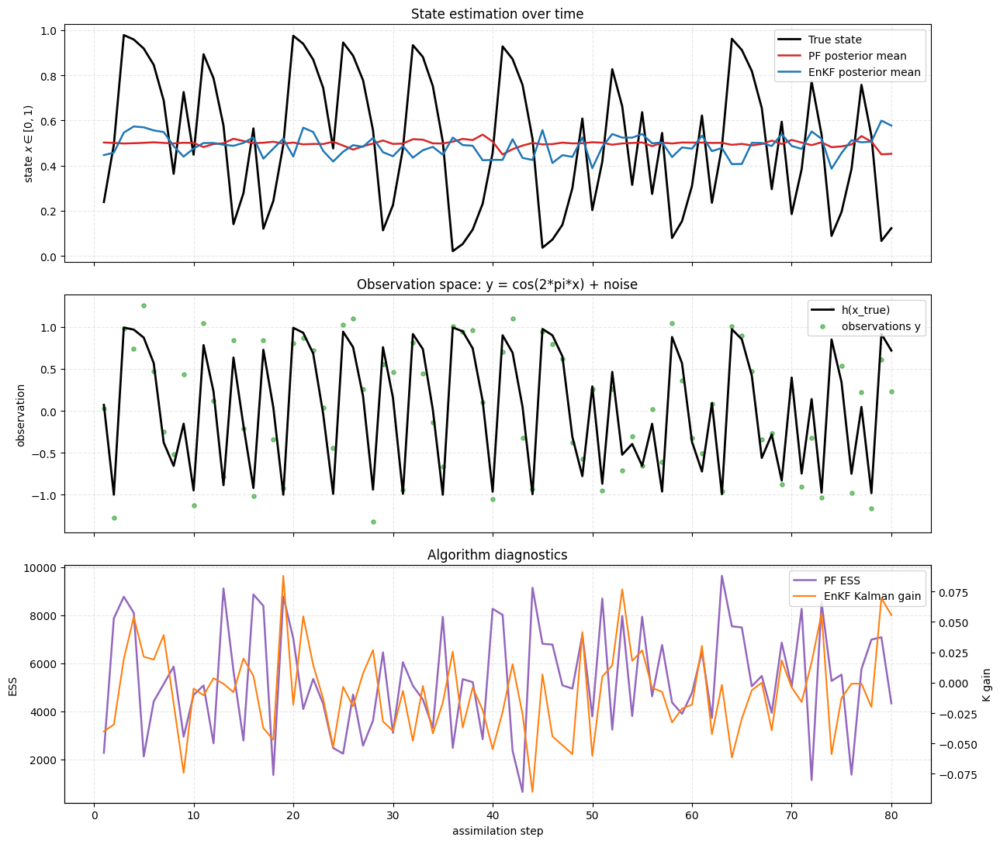

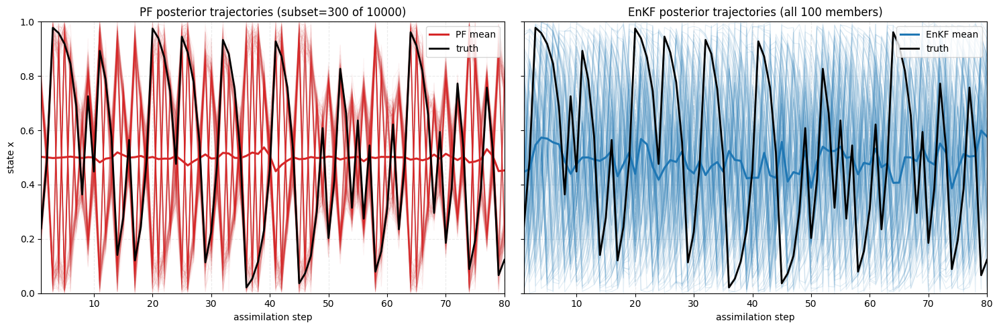

In [20]:
#@title System Overview & Particle Trajectories
t = np.arange(1, T + 1)

fig, axes = plt.subplots(3, 1, figsize=(13, 11), sharex=True)
axes[0].plot(t, x_true_np[1:], color="black", linewidth=2.0, label="True state")
axes[0].plot(t, pf_post_mean_np, color="tab:red", linewidth=1.8, label="PF posterior mean")
axes[0].plot(t, enkf_post_mean_np, color="tab:blue", linewidth=1.8, label="EnKF posterior mean")
axes[0].set_ylabel(r"state $x \in [0,1)$")
axes[0].set_title("State estimation over time")
axes[0].grid(alpha=0.3, linestyle="--")
axes[0].legend(loc="upper right")

axes[1].plot(t, h_obs(x_true_np[1:]), color="black", linewidth=2.0, label="h(x_true)")
axes[1].scatter(t, y_obs_np, s=14, alpha=0.6, color="tab:green", label="observations y")
axes[1].set_ylabel("observation")
axes[1].set_title("Observation space: y = cos(2*pi*x) + noise")
axes[1].grid(alpha=0.3, linestyle="--")
axes[1].legend(loc="upper right")

ax3 = axes[2]
ax3.plot(t, pf_ess_np, color="tab:purple", linewidth=1.8, label="PF ESS")
ax3.axhline(pf_n, color="tab:purple", alpha=0.25, linestyle=":", linewidth=1.0)
ax3.set_ylabel("ESS")
ax3.grid(alpha=0.3, linestyle="--")
ax3.set_xlabel("assimilation step")

ax3b = ax3.twinx()
ax3b.plot(t, enkf_k_np, color="tab:orange", linewidth=1.5, label="EnKF Kalman gain")
ax3b.set_ylabel("K gain")

h1, l1 = ax3.get_legend_handles_labels()
h2, l2 = ax3b.get_legend_handles_labels()
ax3.legend(h1 + h2, l1 + l2, loc="upper right")
axes[2].set_title("Algorithm diagnostics")
plt.tight_layout()
plt.show()

rng = np.random.default_rng(seed)
subset_idx = rng.choice(pf_n, size=min(pf_traj_subset, pf_n), replace=False)

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
for j in subset_idx:
    axes[0].plot(t, pf_post_np[:, j], color="tab:red", alpha=0.05, linewidth=0.7)
axes[0].plot(t, pf_post_mean_np, color="tab:red", linewidth=2.2, label="PF mean")
axes[0].plot(t, x_true_np[1:], color="black", linewidth=2.0, label="truth")
axes[0].set_title(f"PF posterior trajectories (subset={len(subset_idx)} of {pf_n})")
axes[0].set_xlabel("assimilation step")
axes[0].set_ylabel("state x")
axes[0].grid(alpha=0.25, linestyle="--")
axes[0].legend(loc="upper right")

for j in range(enkf_n):
    axes[1].plot(t, enkf_post_np[:, j], color="tab:blue", alpha=0.12, linewidth=0.9)
axes[1].plot(t, enkf_post_mean_np, color="tab:blue", linewidth=2.2, label="EnKF mean")
axes[1].plot(t, x_true_np[1:], color="black", linewidth=2.0, label="truth")
axes[1].set_title(f"EnKF posterior trajectories (all {enkf_n} members)")
axes[1].set_xlabel("assimilation step")
axes[1].grid(alpha=0.25, linestyle="--")
axes[1].legend(loc="upper right")

for ax in axes:
    ax.set_xlim(1, T)
    ax.set_ylim(0.0, 1.0)
plt.tight_layout()
plt.show()

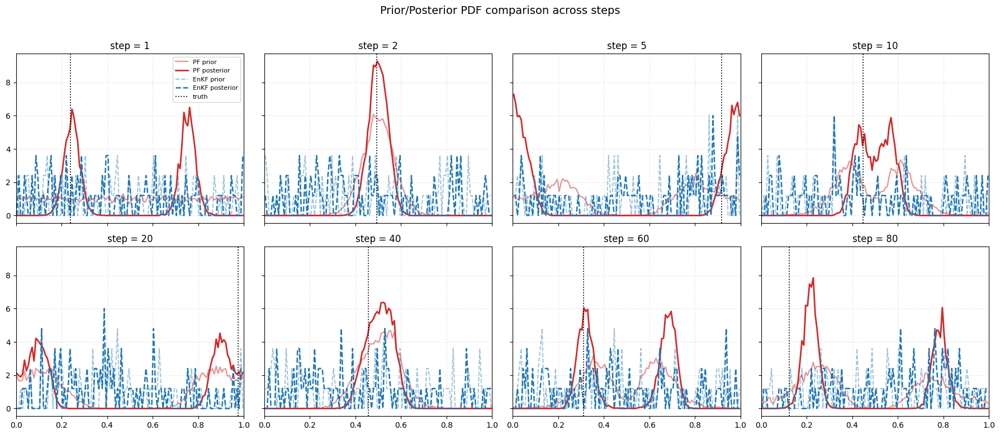

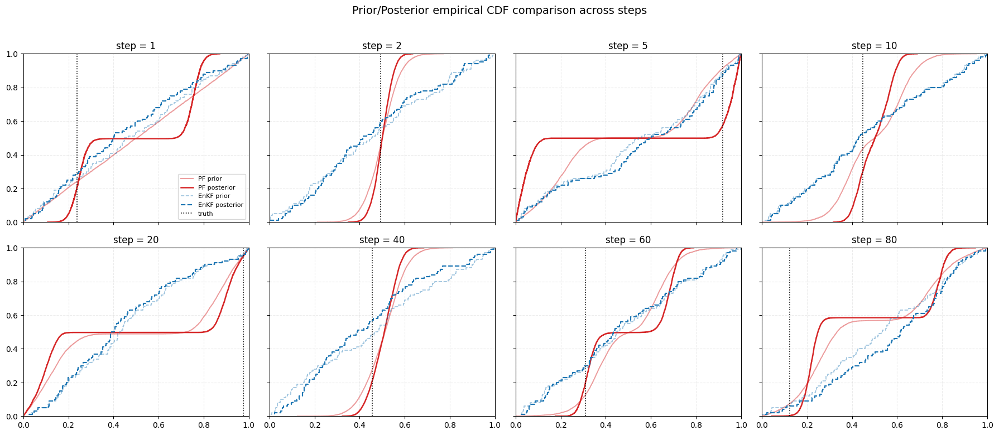

In [21]:
#@title Prior vs Posterior Snapshots
snapshot_idx = [s - 1 for s in snapshot_steps if 1 <= s <= T]
ncols = 4
nrows = int(np.ceil(len(snapshot_idx) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 3.8 * nrows), sharex=True, sharey=True)
axes = np.atleast_1d(axes).ravel()

for i, k in enumerate(snapshot_idx):
    ax = axes[i]
    xg_pf_pr, pdf_pf_pr = hist_pdf(pf_prior_np[k], bins=pdf_bins)
    xg_pf_po, pdf_pf_po = hist_pdf(pf_post_np[k], bins=pdf_bins)
    xg_ek_pr, pdf_ek_pr = hist_pdf(enkf_prior_np[k], bins=pdf_bins)
    xg_ek_po, pdf_ek_po = hist_pdf(enkf_post_np[k], bins=pdf_bins)

    ax.plot(xg_pf_pr, pdf_pf_pr, color="tab:red", alpha=0.5, linewidth=1.6, label="PF prior")
    ax.plot(xg_pf_po, pdf_pf_po, color="tab:red", linewidth=2.0, label="PF posterior")
    ax.plot(xg_ek_pr, pdf_ek_pr, color="tab:blue", alpha=0.45, linewidth=1.4, linestyle="--", label="EnKF prior")
    ax.plot(xg_ek_po, pdf_ek_po, color="tab:blue", linewidth=1.8, linestyle="--", label="EnKF posterior")

    xt = x_true_np[k + 1]
    ax.axvline(xt, color="black", linewidth=1.3, linestyle=":", label="truth")
    ax.set_title(f"step = {k+1}")
    ax.grid(alpha=0.25, linestyle="--")

for j in range(i + 1, len(axes)):
    axes[j].axis("off")
axes[0].legend(loc="upper right", fontsize=8)
for ax in axes:
    if ax.has_data():
        ax.set_xlim(0.0, 1.0)
fig.suptitle("Prior/Posterior PDF comparison across steps", y=1.02, fontsize=14)
fig.tight_layout()
plt.show()

fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 3.8 * nrows), sharex=True, sharey=True)
axes = np.atleast_1d(axes).ravel()

for i, k in enumerate(snapshot_idx):
    ax = axes[i]
    spf_pr, cpf_pr = empirical_cdf(pf_prior_np[k])
    spf_po, cpf_po = empirical_cdf(pf_post_np[k])
    sek_pr, cek_pr = empirical_cdf(enkf_prior_np[k])
    sek_po, cek_po = empirical_cdf(enkf_post_np[k])

    ax.step(spf_pr, cpf_pr, where="post", color="tab:red", alpha=0.45, linewidth=1.4, label="PF prior")
    ax.step(spf_po, cpf_po, where="post", color="tab:red", linewidth=1.8, label="PF posterior")
    ax.step(sek_pr, cek_pr, where="post", color="tab:blue", alpha=0.45, linewidth=1.2, linestyle="--", label="EnKF prior")
    ax.step(sek_po, cek_po, where="post", color="tab:blue", linewidth=1.6, linestyle="--", label="EnKF posterior")

    xt = x_true_np[k + 1]
    ax.axvline(xt, color="black", linewidth=1.2, linestyle=":", label="truth")
    ax.set_title(f"step = {k+1}")
    ax.grid(alpha=0.25, linestyle="--")

for j in range(i + 1, len(axes)):
    axes[j].axis("off")
axes[0].legend(loc="lower right", fontsize=8)
for ax in axes:
    if ax.has_data():
        ax.set_xlim(0.0, 1.0)
        ax.set_ylim(0.0, 1.0)
fig.suptitle("Prior/Posterior empirical CDF comparison across steps", y=1.02, fontsize=14)
fig.tight_layout()
plt.show()

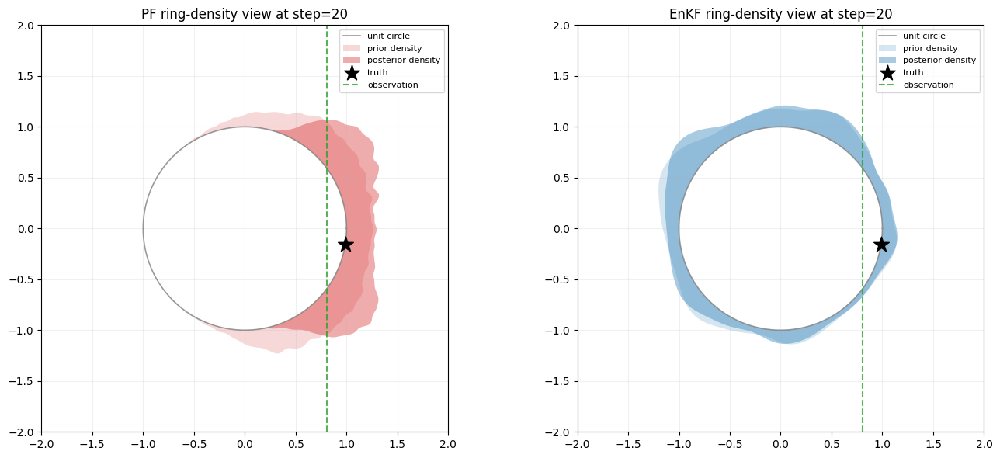

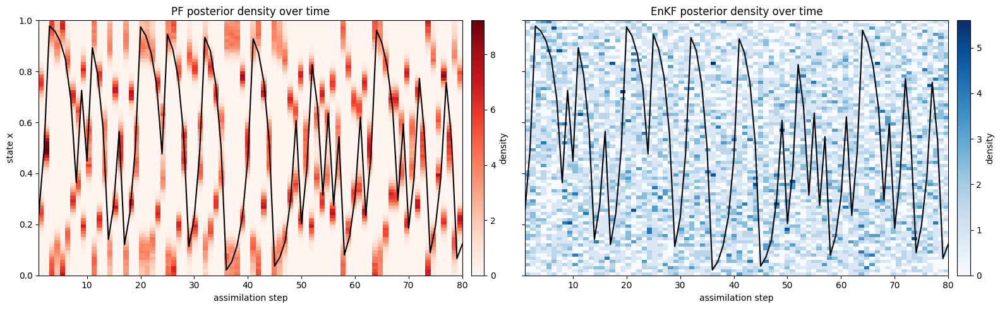

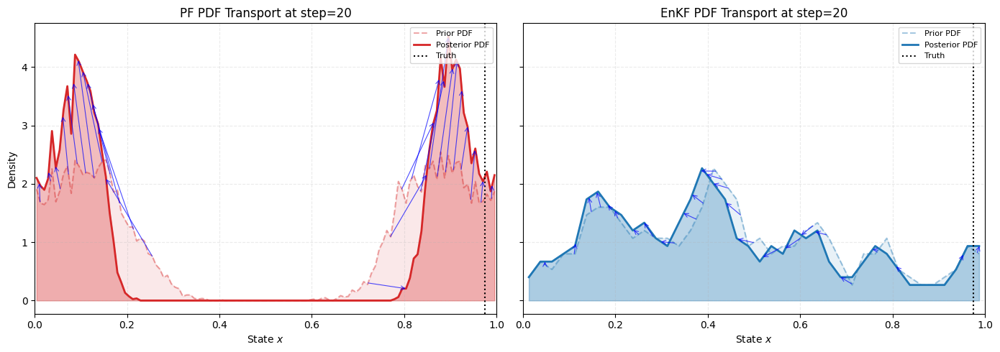

In [22]:
#@title Advanced Visualizations: Ring, Heatmap, and PDF Transport

def smooth_pdf(pdf, window=3):
    """
    Smooth a 1D array using a moving average.
    Input: pdf (Array), window (int)
    Output: Smoothed array (Array)
    """
    w = np.ones(window) / window
    return np.convolve(pdf, w, mode='same')

focus_step = 20 if T >= 20 else T
k = focus_step - 1

# --- 1) Ring Density View ---
phase_pf_prior = np.mod(pf_prior_np[k], 1.0)
phase_pf_post = np.mod(pf_post_np[k], 1.0)
phase_ek_prior = np.mod(enkf_prior_np[k], 1.0)
phase_ek_post = np.mod(enkf_post_np[k], 1.0)

pg_pf_pr, pdf_pf_pr = phase_pdf_curve_01(phase_pf_prior)
pg_pf_po, pdf_pf_po = phase_pdf_curve_01(phase_pf_post)
pg_ek_pr, pdf_ek_pr = phase_pdf_curve_01(phase_ek_prior)
pg_ek_po, pdf_ek_po = phase_pdf_curve_01(phase_ek_post)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, title, pg_pr, p_pr, pg_po, p_po, col in [
    (axes[0], "PF", pg_pf_pr, pdf_pf_pr, pg_pf_po, pdf_pf_po, "tab:red"),
    (axes[1], "EnKF", pg_ek_pr, pdf_ek_pr, pg_ek_po, pdf_ek_po, "tab:blue"),
]:
    phi = np.linspace(0, 2 * np.pi, 600)
    ax.plot(np.cos(phi), np.sin(phi), color="gray", linewidth=1.2, alpha=0.8, label="unit circle")
    draw_ring_pdf_fill(ax, pg_pr, p_pr, color=col, alpha=0.18, label="prior density")
    draw_ring_pdf_fill(ax, pg_po, p_po, color=col, alpha=0.38, label="posterior density")

    theta_true = 2.0 * np.pi * np.mod(x_true_np[k + 1], 1.0)
    ax.scatter(np.cos(theta_true), np.sin(theta_true), marker="*", s=220, c="black", zorder=10, label="truth")
    obs_x = np.clip(y_obs_np[k], -1.2, 1.2)
    ax.axvline(obs_x, color="tab:green", linestyle="--", linewidth=1.5, alpha=0.8, label="observation")

    ax.set_aspect("equal", adjustable="box")
    ax.set_xlim(-2.0, 2.0)
    ax.set_ylim(-2.0, 2.0)
    ax.set_title(f"{title} ring-density view at step={focus_step}")
    ax.grid(alpha=0.18)
    ax.legend(loc="upper right", fontsize=8)
plt.tight_layout()
plt.show()

# --- 2) Temporal Density Heatmap ---
def density_matrix(samples_tn, bins=80):
    """
    Compute temporal density matrix for heatmap generation.
    Input: samples_tn (Array), bins (int)
    Output: Tuple of density matrix and bin centers
    """
    mats = []
    edges = None
    for j in range(samples_tn.shape[0]):
        h, edges = np.histogram(samples_tn[j], bins=bins, range=(0.0, 1.0), density=True)
        mats.append(h)
    mat = np.asarray(mats).T
    centers = 0.5 * (edges[:-1] + edges[1:])
    return mat, centers

pf_mat, ybins = density_matrix(pf_post_np, bins=heatmap_bins)
enkf_mat, _ = density_matrix(enkf_post_np, bins=heatmap_bins)

fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)
im0 = axes[0].imshow(pf_mat, origin="lower", aspect="auto", extent=[1, T, 0.0, 1.0], cmap="Reds")
axes[0].plot(np.arange(1, T + 1), x_true_np[1:], color="black", linewidth=1.5)
axes[0].set_title("PF posterior density over time")
axes[0].set_xlabel("assimilation step")
axes[0].set_ylabel("state x")
im1 = axes[1].imshow(enkf_mat, origin="lower", aspect="auto", extent=[1, T, 0.0, 1.0], cmap="Blues")
axes[1].plot(np.arange(1, T + 1), x_true_np[1:], color="black", linewidth=1.5)
axes[1].set_title("EnKF posterior density over time")
axes[1].set_xlabel("assimilation step")

cbar0 = plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.02)
cbar0.set_label("density")
cbar1 = plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.02)
cbar1.set_label("density")
plt.tight_layout()
plt.show()

# --- 3) PDF Transport Visualization ---
q_levels = np.linspace(0.02, 0.98, 25)
enkf_pdf_bins = 40

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

for ax, title, pr_samples, po_samples, col, bins, do_smooth in [
    (axes[0], "PF", pf_prior_np[k], pf_post_np[k], "tab:red", pdf_bins, False),
    (axes[1], "EnKF", enkf_prior_np[k], enkf_post_np[k], "tab:blue", enkf_pdf_bins, True),
]:
    xg_pr, pdf_pr = hist_pdf(pr_samples, bins=bins)
    xg_po, pdf_po = hist_pdf(po_samples, bins=bins)

    if do_smooth:
        pdf_pr = smooth_pdf(pdf_pr, window=3)
        pdf_po = smooth_pdf(pdf_po, window=3)

    ax.plot(xg_pr, pdf_pr, color=col, alpha=0.4, linestyle="--", linewidth=1.5, label="Prior PDF")
    ax.fill_between(xg_pr, pdf_pr, color=col, alpha=0.1)

    ax.plot(xg_po, pdf_po, color=col, linewidth=2.0, label="Posterior PDF")
    ax.fill_between(xg_po, pdf_po, color=col, alpha=0.3)

    x_pr_q = np.quantile(pr_samples, q_levels)
    x_po_q = np.quantile(po_samples, q_levels)

    y_pr_q = np.interp(x_pr_q, xg_pr, pdf_pr)
    y_po_q = np.interp(x_po_q, xg_po, pdf_po)

    for x0, y0, x1, y1 in zip(x_pr_q, y_pr_q, x_po_q, y_po_q):
        ax.annotate(
            "", xy=(x1, y1), xytext=(x0, y0),
            arrowprops=dict(arrowstyle="->", color="blue", alpha=0.7, shrinkA=0, shrinkB=0, linewidth=0.8)
        )

    ax.axvline(x_true_np[k + 1], color="black", linestyle=":", linewidth=1.5, label="Truth")

    ax.set_title(f"{title} PDF Transport at step={focus_step}")
    ax.set_xlabel("State $x$")
    ax.set_xlim(0.0, 1.0)
    ax.grid(alpha=0.25, linestyle="--")
    ax.legend(loc="upper right", fontsize=8)

axes[0].set_ylabel("Density")
plt.tight_layout()
plt.show()

In [24]:
#@title Animation Visualization: PF vs EnKF Ring Density
from matplotlib import animation
import matplotlib.patches as mpatches
from IPython.display import HTML

def get_ring_polygon(phase_grid, pdf_vals):
    """
    Calculate polygon vertices for ring density visualization.
    Input: phase_grid (Array), pdf_vals (Array)
    Output: Polygon vertices of shape (2N, 2) (Array)
    """
    theta = 2.0 * np.pi * np.mod(phase_grid, 1.0)
    pdf = np.maximum(np.nan_to_num(pdf_vals), 0.0)
    r_outer = np.sqrt(1.0 + pdf / np.pi)

    theta_w = np.concatenate([theta, [theta[0] + 2.0 * np.pi]])
    r_outer_w = np.concatenate([r_outer, [r_outer[0]]])

    x_outer = r_outer_w * np.cos(theta_w)
    y_outer = r_outer_w * np.sin(theta_w)
    x_inner = np.cos(theta_w)
    y_inner = np.sin(theta_w)

    poly_x = np.concatenate([x_outer, x_inner[::-1]])
    poly_y = np.concatenate([y_outer, y_inner[::-1]])
    return np.column_stack([poly_x, poly_y])

anim_steps = min(T, 50)
fig_anim_ring, axes_anim_ring = plt.subplots(1, 2, figsize=(14, 6))
plt.close(fig_anim_ring)

patches = {'pf_pr': None, 'pf_po': None, 'ek_pr': None, 'ek_po': None}
scatters = {'pf_true': None, 'ek_true': None}
lines = {'pf_obs': None, 'ek_obs': None}

phi = np.linspace(0, 2 * np.pi, 600)
circle_x = np.cos(phi)
circle_y = np.sin(phi)

for i, (title, col) in enumerate([("PF", "tab:red"), ("EnKF", "tab:blue")]):
    ax = axes_anim_ring[i]
    ax.plot(circle_x, circle_y, color="gray", linewidth=1.2, alpha=0.8, label="unit circle")

    p_pr = mpatches.Polygon(np.empty((0, 2)), color=col, alpha=0.18, label="prior density")
    p_po = mpatches.Polygon(np.empty((0, 2)), color=col, alpha=0.38, label="posterior density")
    ax.add_patch(p_pr)
    ax.add_patch(p_po)

    obs_line = ax.axvline(0, color="tab:green", linestyle="--", linewidth=1.5, alpha=0.8, label="observation")
    true_scatter = ax.scatter([], [], marker="*", s=220, c="black", zorder=10, label="truth")

    if i == 0:
        patches['pf_pr'], patches['pf_po'] = p_pr, p_po
        scatters['pf_true'], lines['pf_obs'] = true_scatter, obs_line
    else:
        patches['ek_pr'], patches['ek_po'] = p_pr, p_po
        scatters['ek_true'], lines['ek_obs'] = true_scatter, obs_line

    ax.set_aspect("equal", adjustable="box")
    ax.set_xlim(-2.0, 2.0)
    ax.set_ylim(-2.0, 2.0)
    ax.grid(alpha=0.18)
    ax.legend(loc="upper right", fontsize=8)

def animate_ring(k):
    """
    Update animation frames for ring density visualization.
    Input: k (int)
    Output: List of updated artist objects
    """
    phase_pf_prior = np.mod(pf_prior_np[k], 1.0)
    phase_pf_post = np.mod(pf_post_np[k], 1.0)
    pg_pf_pr, pdf_pf_pr = phase_pdf_curve_01(phase_pf_prior)
    pg_pf_po, pdf_pf_po = phase_pdf_curve_01(phase_pf_post)

    patches['pf_pr'].set_xy(get_ring_polygon(pg_pf_pr, pdf_pf_pr))
    patches['pf_po'].set_xy(get_ring_polygon(pg_pf_po, pdf_pf_po))

    theta_true = 2.0 * np.pi * np.mod(x_true_np[k + 1], 1.0)
    true_pos = [[np.cos(theta_true), np.sin(theta_true)]]
    scatters['pf_true'].set_offsets(true_pos)

    obs_x = np.clip(y_obs_np[k], -1.2, 1.2)
    lines['pf_obs'].set_xdata([obs_x, obs_x])
    axes_anim_ring[0].set_title(f"PF Ring Density (Step {k+1})")

    phase_ek_prior = np.mod(enkf_prior_np[k], 1.0)
    phase_ek_post = np.mod(enkf_post_np[k], 1.0)
    pg_ek_pr, pdf_ek_pr = phase_pdf_curve_01(phase_ek_prior)
    pg_ek_po, pdf_ek_po = phase_pdf_curve_01(phase_ek_post)

    patches['ek_pr'].set_xy(get_ring_polygon(pg_ek_pr, pdf_ek_pr))
    patches['ek_po'].set_xy(get_ring_polygon(pg_ek_po, pdf_ek_po))

    scatters['ek_true'].set_offsets(true_pos)
    lines['ek_obs'].set_xdata([obs_x, obs_x])
    axes_anim_ring[1].set_title(f"EnKF Ring Density (Step {k+1})")

    return list(patches.values()) + list(scatters.values()) + list(lines.values())

anim_ring = animation.FuncAnimation(fig_anim_ring, animate_ring, frames=anim_steps, interval=400, blit=True)
HTML(anim_ring.to_jshtml())